In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score, cross_val_predict
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler, label_binarize, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE, chi2, mutual_info_classif, f_classif, SelectKBest, SequentialFeatureSelector
from imblearn.over_sampling import SMOTE
from sklearn.utils.class_weight import compute_sample_weight

from utils import calculate_evaluation_metrics, display_shap_plot, display_lime_plot, plot_class_probability_distributions, get_selected_features

<h3>Classification results, input: statistics from the <b>first 5</b> seasons</h3>

In [2]:
df_5 = pd.read_csv('data/final_dataset_5_seasons.csv', low_memory=False)

class_mapping = {'bench': 0, 'starter': 1, 'all-star': 2}
df_5['Player_class_num'] = df_5['Player_class'].map(class_mapping)

final_dataset_5_seasons = df_5[get_selected_features(5)]

X = final_dataset_5_seasons.drop(columns=['Player_class_num'])
y = final_dataset_5_seasons['Player_class_num']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

Best params: {'xgb__learning_rate': 0.01, 'xgb__max_depth': 3, 'xgb__n_estimators': 500, 'xgb__subsample': 0.9}

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.70      0.81      0.75        88
           1       0.59      0.55      0.57        75
           2       0.83      0.58      0.68        26

    accuracy                           0.67       189
   macro avg       0.71      0.64      0.67       189
weighted avg       0.67      0.67      0.67       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8500452850274142
PR AUC: 0.7559849978581775


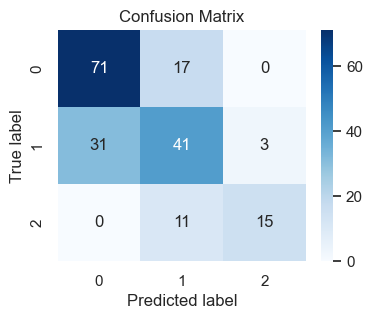

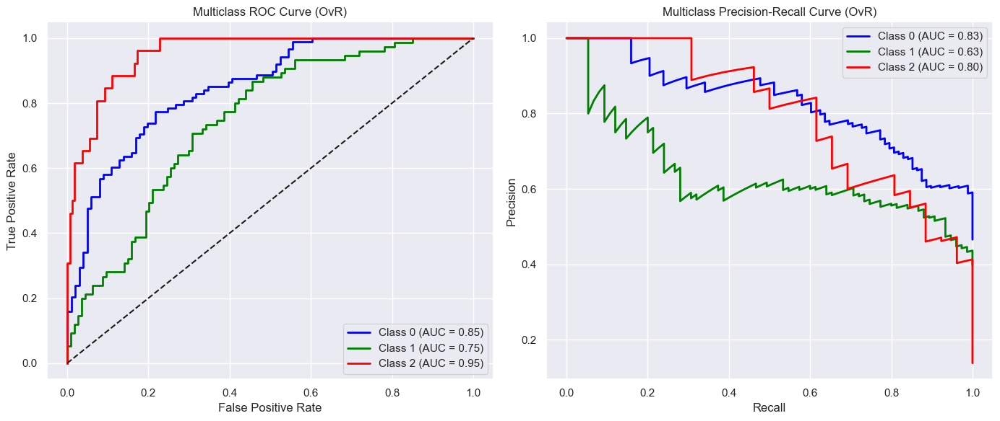

In [5]:
param_grid = {
    'xgb__n_estimators': [100, 200, 300, 400, 500],
    'xgb__max_depth': [3, 4, 5, 6],
    'xgb__learning_rate': [0.01, 0.1, 0.3, 0.4],
    'xgb__subsample': [0.8, 0.9, 1.0]
}

grid_search = GridSearchCV(
    estimator=XGBClassifier(random_state=42, eval_metric='mlogloss', use_label_encoder=False),
    param_grid=param_grid,
    cv=10,
    scoring='f1_macro',
    n_jobs=-1
)

grid_search.fit(X_train, y_train)

print("Best params:", grid_search.best_params_)

best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)

calculate_evaluation_metrics(best_model, y_test, y_pred, y_pred_proba)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.72      0.77      0.74        88
           1       0.61      0.57      0.59        75
           2       0.75      0.69      0.72        26

    accuracy                           0.68       189
   macro avg       0.69      0.68      0.69       189
weighted avg       0.68      0.68      0.68       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8803551825836567
PR AUC: 0.804549146931229


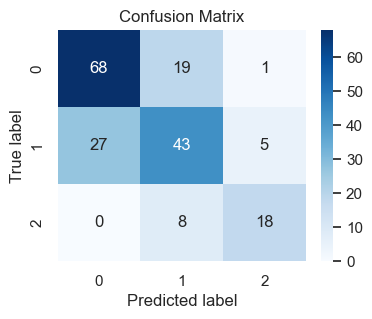

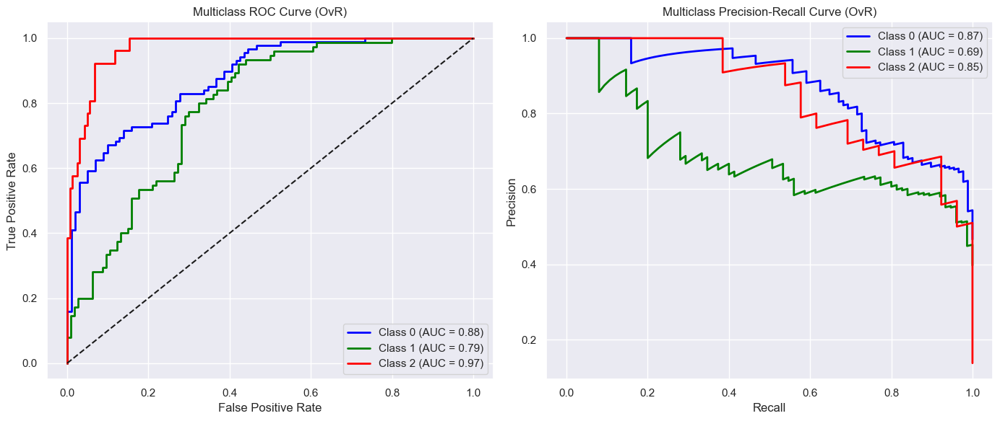


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.95      0.83      0.89       163
           1       0.40      0.73      0.52        26

    accuracy                           0.81       189
   macro avg       0.68      0.78      0.70       189
weighted avg       0.88      0.81      0.84       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.9306276545540348
PR AUC: 0.7323365091723503


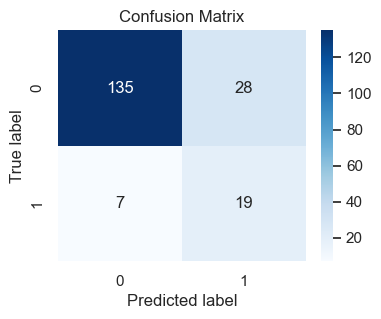

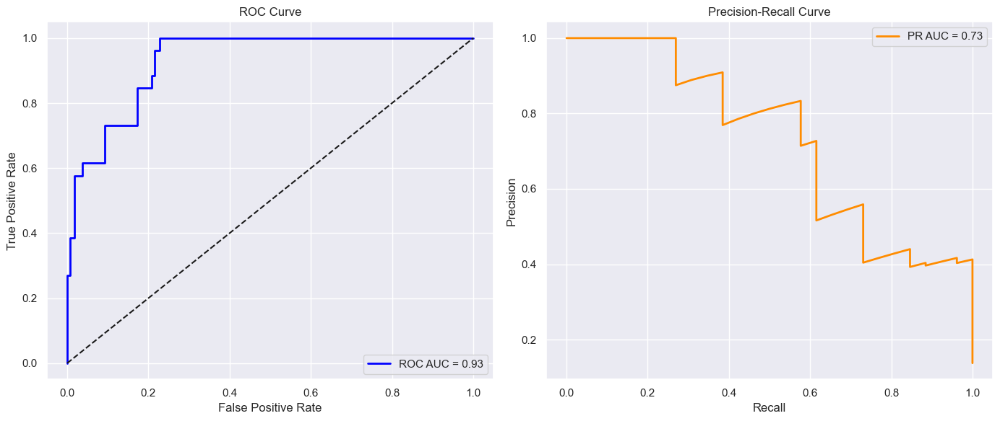


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.85      0.68      0.76       114
           1       0.63      0.81      0.71        75

    accuracy                           0.74       189
   macro avg       0.74      0.75      0.73       189
weighted avg       0.76      0.74      0.74       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8002339181286549
PR AUC: 0.693714262795836


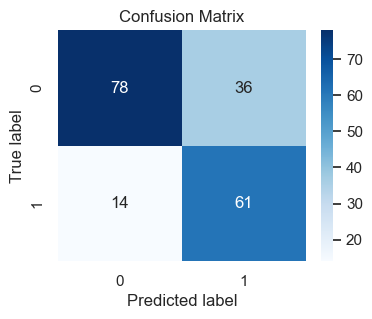

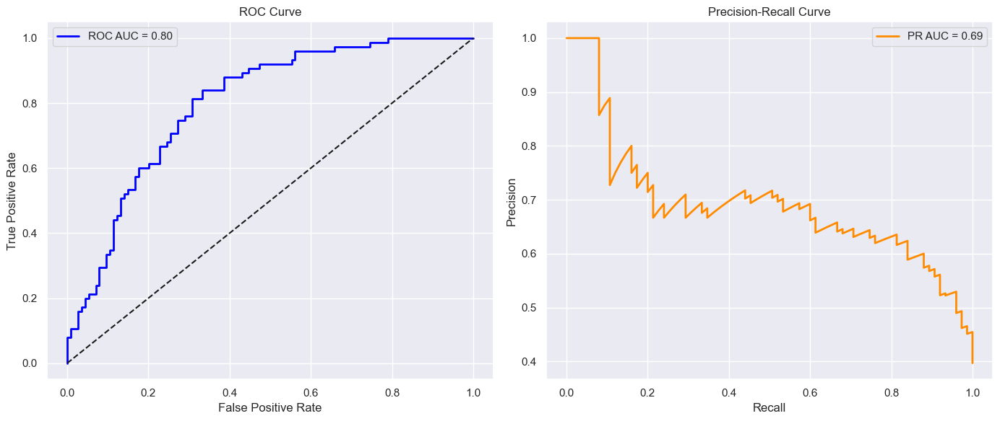


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.80      0.81      0.81       101
           1       0.78      0.77      0.78        88

    accuracy                           0.79       189
   macro avg       0.79      0.79      0.79       189
weighted avg       0.79      0.79      0.79       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.870049504950495
PR AUC: 0.8286595536527086


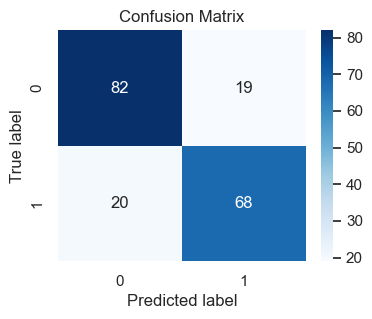

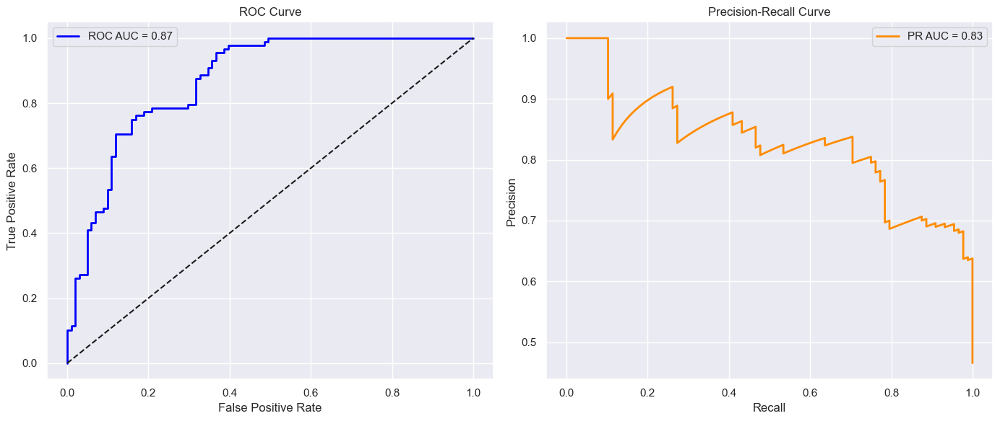

In [67]:
xgb = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',
    use_label_encoder=False,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=500,
    subsample=0.9
)
weights = compute_sample_weight(class_weight='balanced', y=y_train)

xgb.fit(X_train, y_train, sample_weight=weights)

y_pred = xgb.predict(X_test)
y_pred_proba = xgb.predict_proba(X_test)

calculate_evaluation_metrics(xgb, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_5_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    xgb_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        use_label_encoder=False,
        learning_rate=0.01,
        max_depth=3,
        n_estimators=500,
        subsample=0.9
    )
    weights = compute_sample_weight(class_weight='balanced', y=y_train_bin)

    xgb_bin.fit(X_train_bin, y_train_bin, sample_weight=weights)

    y_pred_bin = xgb_bin.predict(X_test_bin)
    y_pred_proba_bin = xgb_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

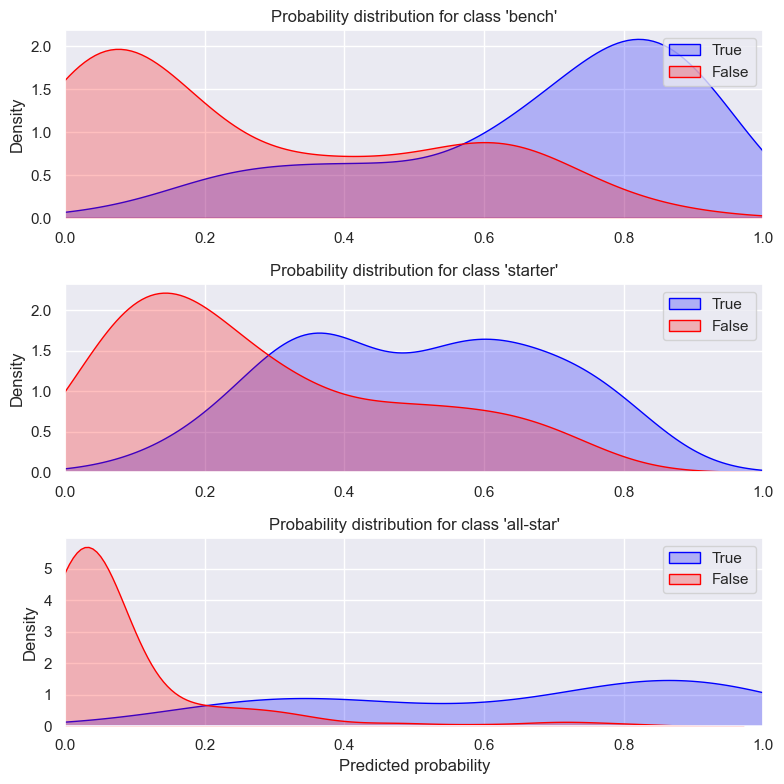

PermutationExplainer explainer: 190it [01:06,  2.50it/s]                         


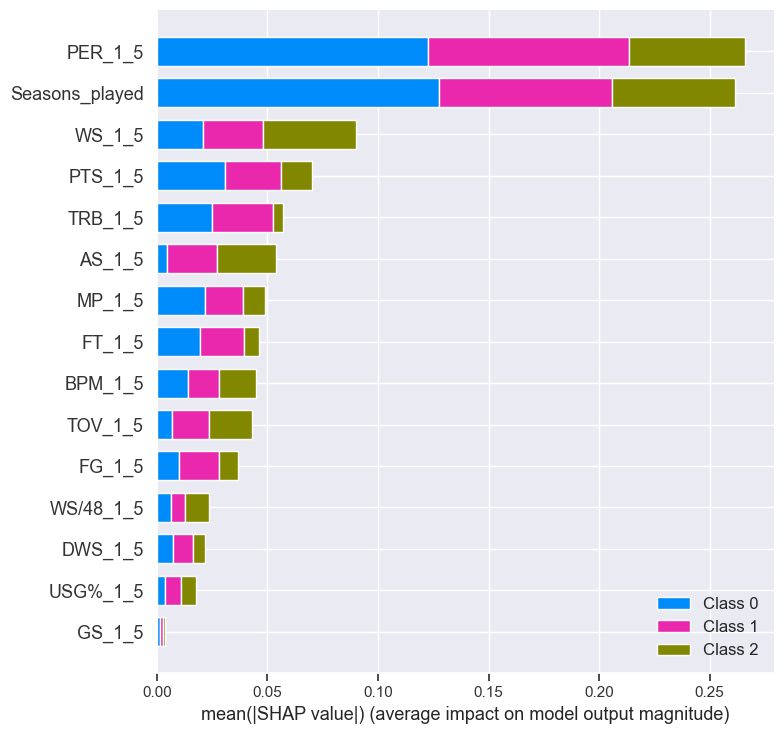

In [68]:
plot_class_probability_distributions(y_test, y_pred_proba)
display_shap_plot(xgb, X_train, X_test)

In [34]:
y_test.iloc[0]

0

In [4]:
display_lime_plot(xgb, X_train, X_test, 0)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.91      0.60      0.73        88
           1       0.61      0.88      0.72        75
           2       0.77      0.65      0.71        26

    accuracy                           0.72       189
   macro avg       0.76      0.71      0.72       189
weighted avg       0.77      0.72      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8795528987670217
PR AUC: 0.8047205637897821


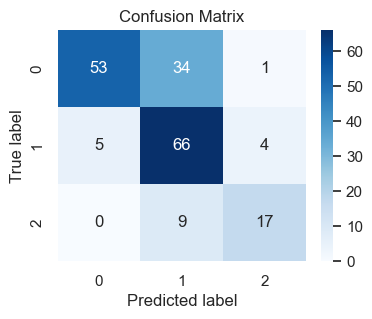

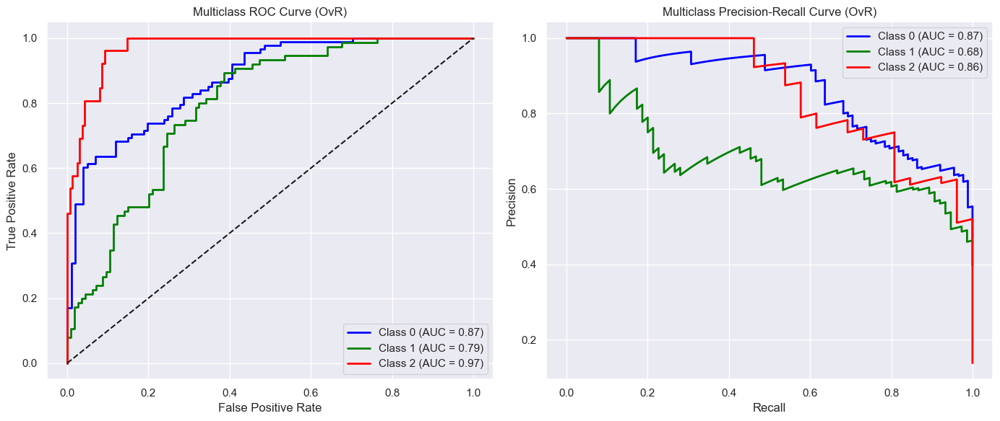


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.95      0.90      0.92       163
           1       0.53      0.73      0.61        26

    accuracy                           0.87       189
   macro avg       0.74      0.81      0.77       189
weighted avg       0.90      0.87      0.88       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.929683813119396
PR AUC: 0.732985246272549


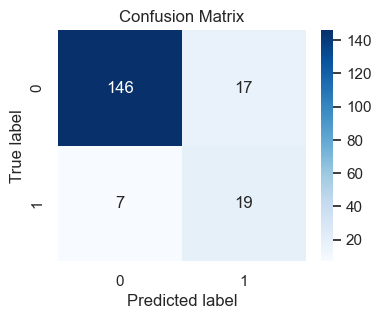

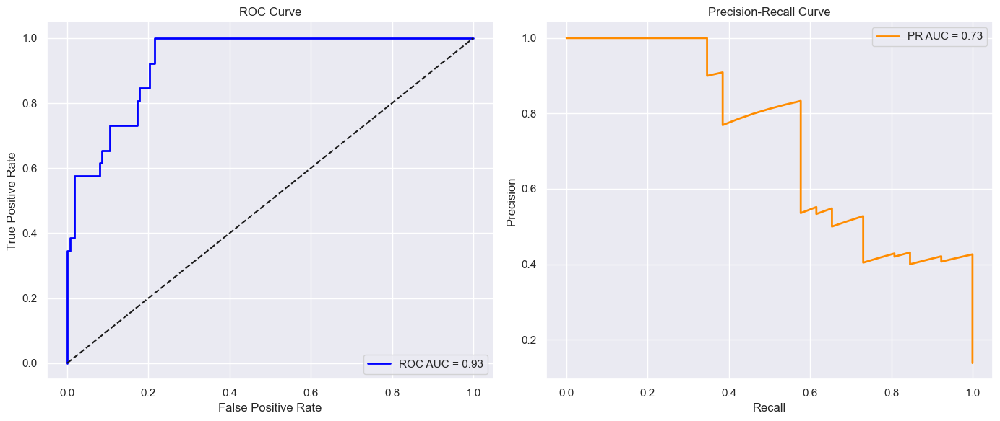


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.88      0.61      0.72       114
           1       0.60      0.87      0.71        75

    accuracy                           0.71       189
   macro avg       0.74      0.74      0.71       189
weighted avg       0.76      0.71      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8028070175438597
PR AUC: 0.6981636610759004


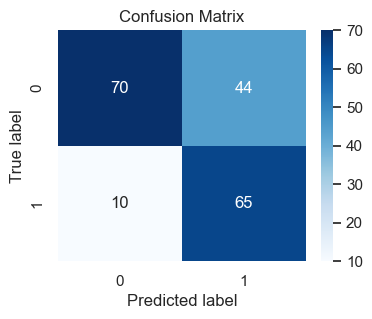

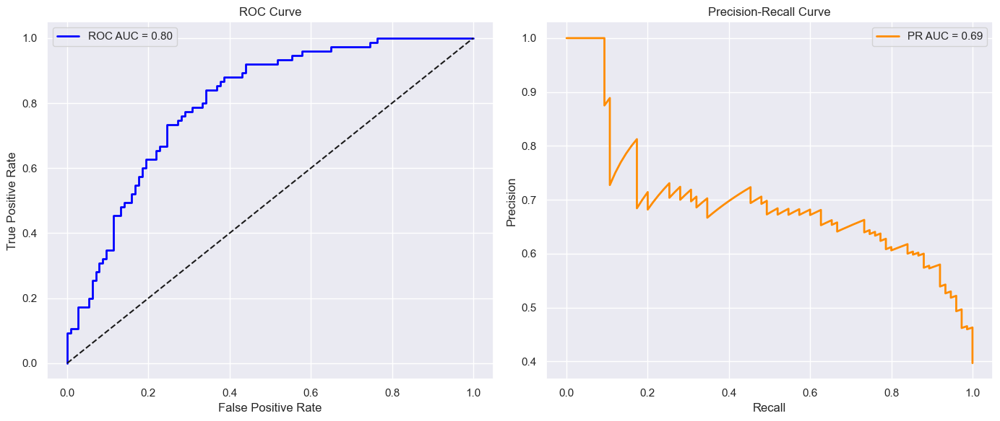


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.80      0.70      0.75       101
           1       0.70      0.80      0.74        88

    accuracy                           0.75       189
   macro avg       0.75      0.75      0.75       189
weighted avg       0.75      0.75      0.75       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8681368136813681
PR AUC: 0.8293065104025156


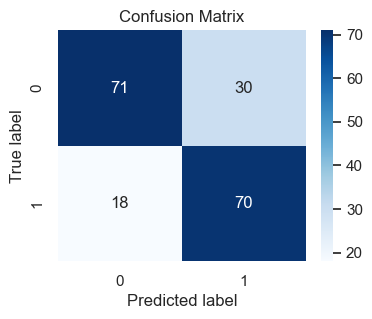

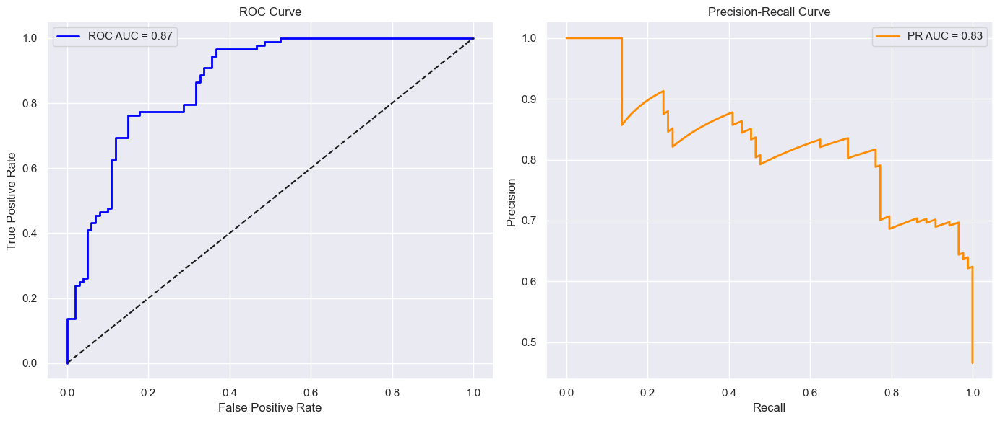

In [61]:
xgb = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',
    use_label_encoder=False,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=500,
    subsample=0.9
)
weights = compute_sample_weight({0: 1, 1: 3, 2: 6}, y_train)

xgb.fit(X_train, y_train, sample_weight=weights)

y_pred = xgb.predict(X_test)
y_pred_proba = xgb.predict_proba(X_test)

calculate_evaluation_metrics(xgb, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_5_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    xgb_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        use_label_encoder=False,
        learning_rate=0.01,
        max_depth=3,
        n_estimators=520,
        subsample=0.9
    )
    weights = compute_sample_weight({0: 1, 1: 2}, y_train_bin)
    
    xgb_bin.fit(X_train_bin, y_train_bin, sample_weight=weights)

    y_pred_bin = xgb_bin.predict(X_test_bin)
    y_pred_proba_bin = xgb_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.77      0.70      0.73        88
           1       0.61      0.64      0.62        75
           2       0.69      0.77      0.73        26

    accuracy                           0.69       189
   macro avg       0.69      0.70      0.69       189
weighted avg       0.69      0.69      0.69       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8737284710811312
PR AUC: 0.7983334056373262


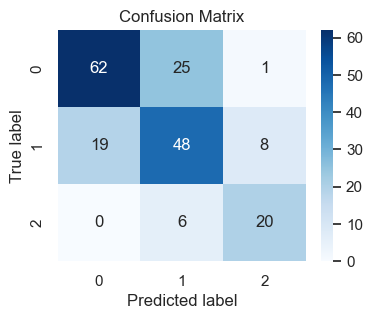

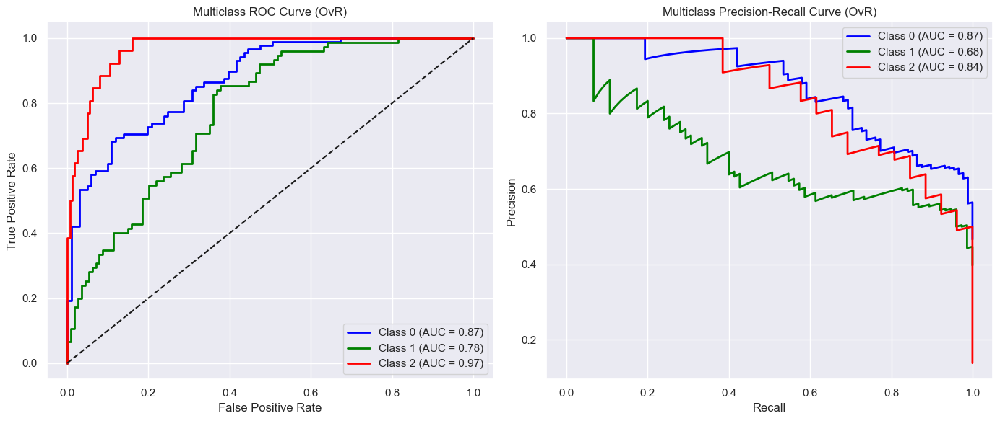


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.95      0.83      0.89       163
           1       0.41      0.73      0.53        26

    accuracy                           0.82       189
   macro avg       0.68      0.78      0.71       189
weighted avg       0.88      0.82      0.84       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.9285040113260972
PR AUC: 0.717099472971558


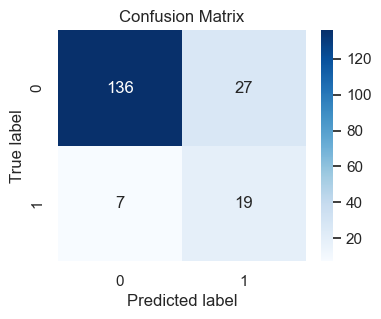

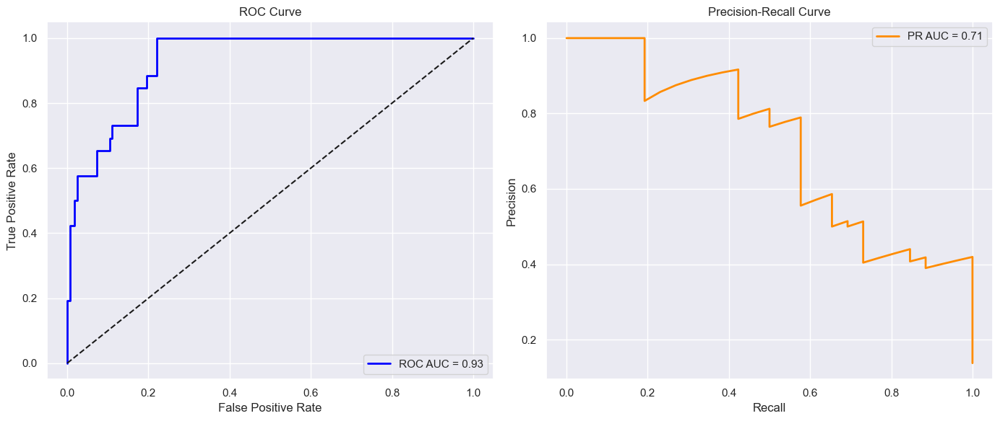


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.90      0.46      0.60       114
           1       0.53      0.92      0.67        75

    accuracy                           0.64       189
   macro avg       0.71      0.69      0.64       189
weighted avg       0.75      0.64      0.63       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7973099415204679
PR AUC: 0.6872846870564784


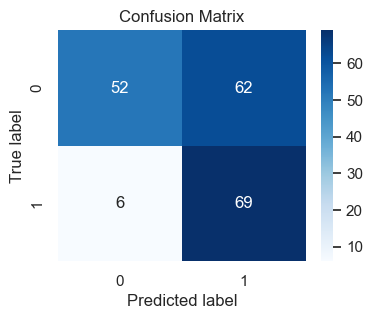

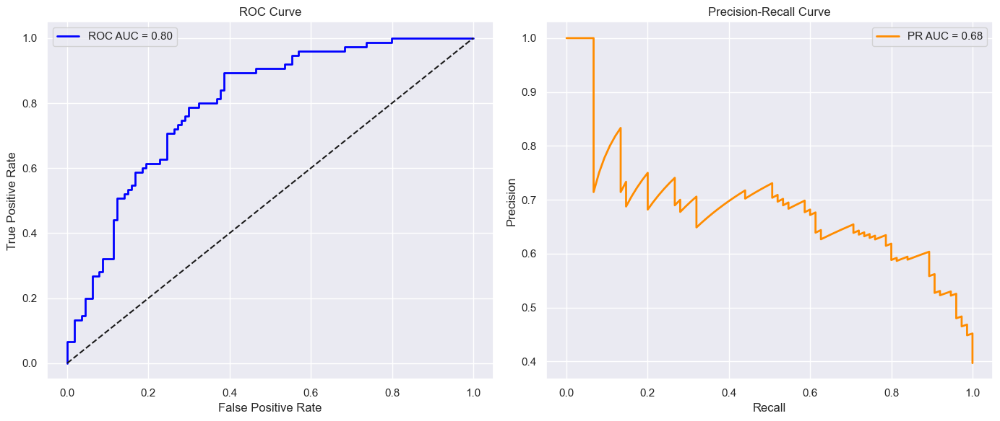


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.97      0.58      0.73       101
           1       0.67      0.98      0.80        88

    accuracy                           0.77       189
   macro avg       0.82      0.78      0.76       189
weighted avg       0.83      0.77      0.76       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8708370837083709
PR AUC: 0.8336496966605205


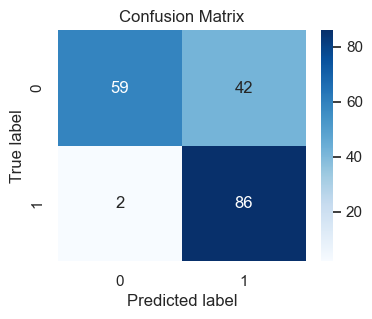

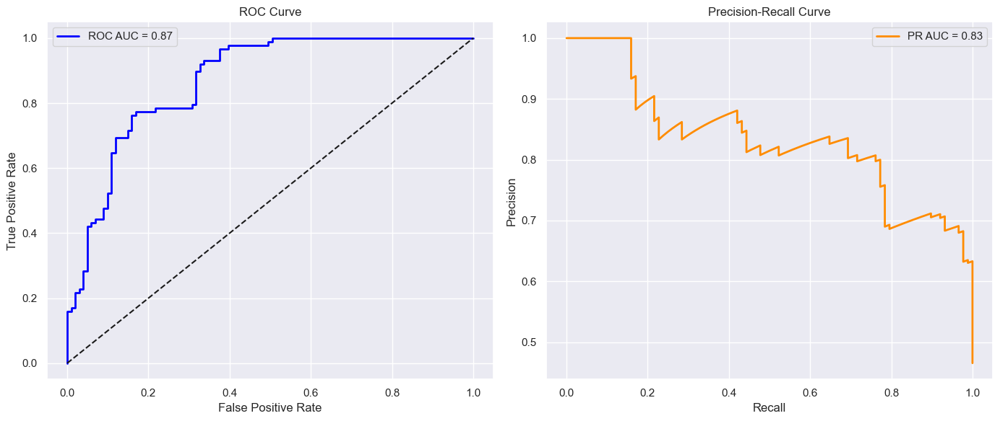

In [64]:
xgb = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',
    use_label_encoder=False,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=400,
    subsample=0.9
)
ovr = OneVsRestClassifier(xgb)
ovr.fit(X_train, y_train)

y_pred_proba = ovr.predict_proba(X_test)

custom_preds = []
for probs in y_pred_proba:
    if probs[2] >= 0.19:        
        custom_preds.append(2)
    elif probs[1] >= 0.36:      
        custom_preds.append(1)
    else:
        custom_preds.append(0) 
        
y_pred_proba = y_pred_proba / y_pred_proba.sum(axis=1, keepdims=True)

calculate_evaluation_metrics(ovr, y_test, custom_preds, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_5_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    xgb_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        use_label_encoder=False,
        learning_rate=0.01,
        max_depth=3,
        n_estimators=400,
        subsample=0.9
    )

    xgb_bin.fit(X_train_bin, y_train_bin)

    y_pred_proba_bin = xgb_bin.predict_proba(X_test_bin)
    y_pred_bin = (y_pred_proba_bin[:,1] >= 0.2).astype(int)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

Number of elements in each class:
Player_class_num
0    351
1    300
2    102
Name: count, dtype: int64

Number of elements in each class after sampling:
Player_class_num
1    351
0    351
2    351
Name: count, dtype: int64

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.72      0.78      0.75        88
           1       0.61      0.56      0.58        75
           2       0.71      0.65      0.68        26

    accuracy                           0.68       189
   macro avg       0.68      0.67      0.67       189
weighted avg       0.67      0.68      0.67       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8701010610776848
PR AUC: 0.7848624770766564


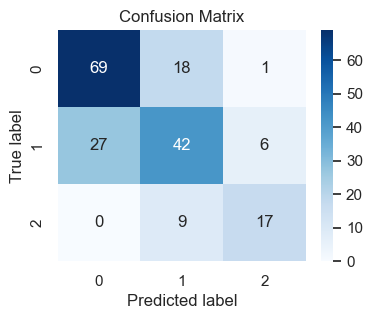

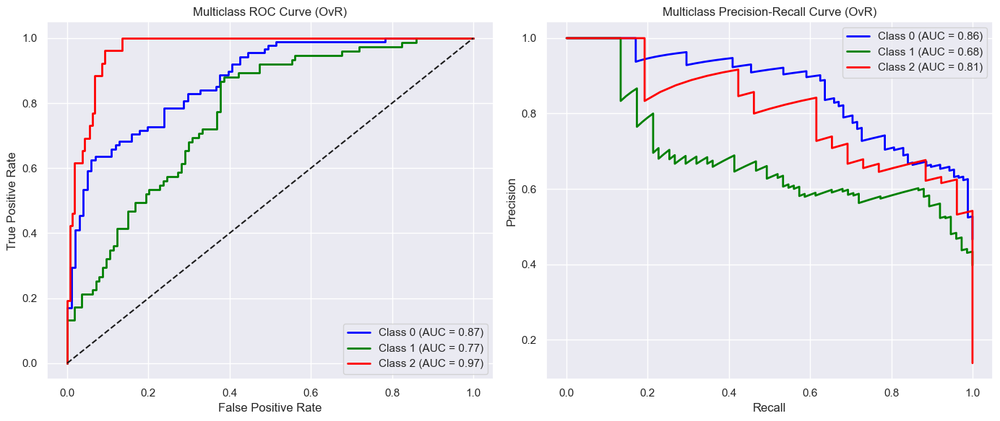

Number of elements in each class:
all-star_class
0    651
1    102
Name: count, dtype: int64

Number of elements in each class after sampling:
all-star_class
0    651
1    651
Name: count, dtype: int64

Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.96      0.83      0.89       163
           1       0.42      0.77      0.54        26

    accuracy                           0.82       189
   macro avg       0.69      0.80      0.71       189
weighted avg       0.88      0.82      0.84       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.9235488437942425
PR AUC: 0.6856196180390792


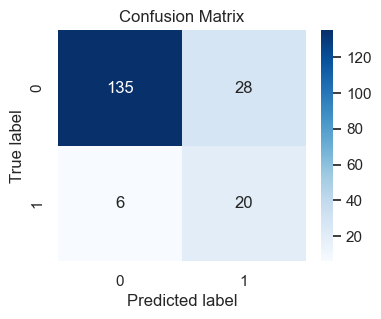

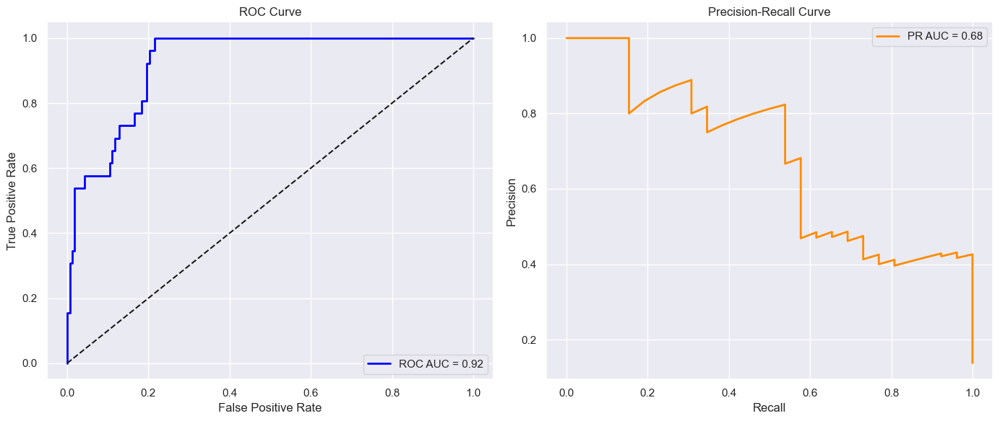

Number of elements in each class:
starter_class
0    453
1    300
Name: count, dtype: int64

Number of elements in each class after sampling:
starter_class
1    453
0    453
Name: count, dtype: int64

Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.81      0.68      0.74       114
           1       0.61      0.76      0.67        75

    accuracy                           0.71       189
   macro avg       0.71      0.72      0.71       189
weighted avg       0.73      0.71      0.71       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7909941520467836
PR AUC: 0.6589653020575488


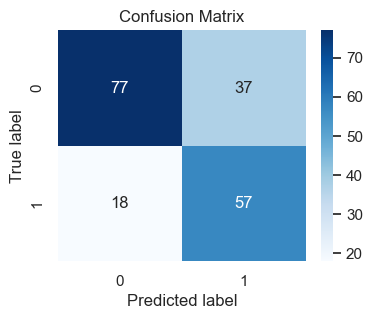

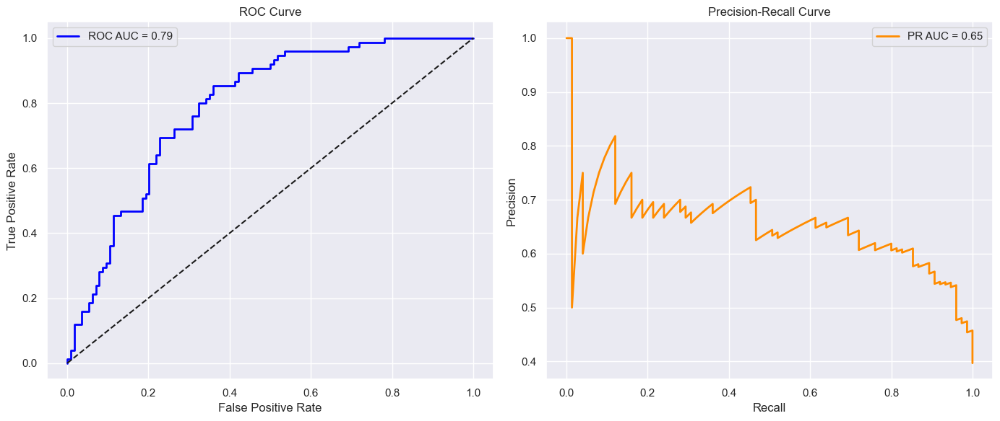

Number of elements in each class:
bench_class
0    402
1    351
Name: count, dtype: int64

Number of elements in each class after sampling:
bench_class
1    402
0    402
Name: count, dtype: int64

Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.80      0.79      0.80       101
           1       0.76      0.77      0.77        88

    accuracy                           0.78       189
   macro avg       0.78      0.78      0.78       189
weighted avg       0.78      0.78      0.78       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8682493249324932
PR AUC: 0.832619348826825


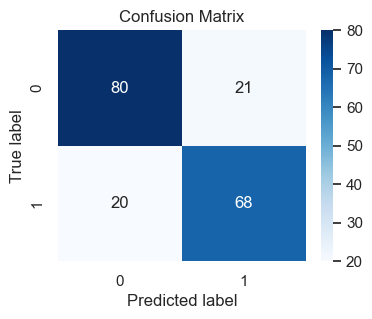

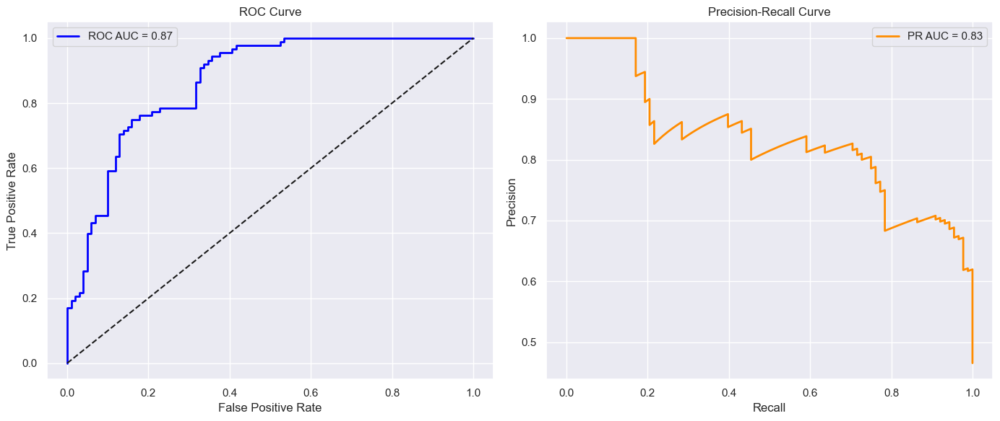

In [51]:
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

print('Number of elements in each class:')
print(y_train.value_counts())
print('\nNumber of elements in each class after sampling:')
print(pd.Series(y_res).value_counts())

xgb_smote = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',     
    max_depth=3,          
    learning_rate=0.01,  
    n_estimators=520,  
    subsample=0.9
)

xgb_smote.fit(X_res, y_res)

y_pred = xgb_smote.predict(X_test)
y_pred_proba = xgb_smote.predict_proba(X_test)

calculate_evaluation_metrics(xgb_smote, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_5_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    smote = SMOTE(random_state=42)
    X_res_bin, y_res_bin = smote.fit_resample(X_train_bin, y_train_bin)

    print('Number of elements in each class:')
    print(y_train_bin.value_counts())
    print('\nNumber of elements in each class after sampling:')
    print(pd.Series(y_res_bin).value_counts())
    
    xgb_smote_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',     
        max_depth=3,          
        learning_rate=0.01,  
        n_estimators=520,  
        subsample=0.9
    )

    xgb_smote_bin.fit(X_res_bin, y_res_bin)

    y_pred_bin = xgb_smote_bin.predict(X_test_bin)
    y_pred_proba_bin = xgb_smote_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_smote_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

<h3>Classification results, input: statistics from the <b>first 3</b> seasons</h3>

In [6]:
df_3 = pd.read_csv('data/final_dataset_3_seasons.csv', low_memory=False)

class_mapping = {'bench': 0, 'starter': 1, 'all-star': 2}
df_3['Player_class_num'] = df_3['Player_class'].map(class_mapping)

final_dataset_3_seasons = df_3[get_selected_features(3)]

X = final_dataset_3_seasons.drop(columns=['Player_class_num'])
y = final_dataset_3_seasons['Player_class_num']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.69      0.84      0.76        88
           1       0.61      0.49      0.54        75
           2       0.67      0.54      0.60        26

    accuracy                           0.66       189
   macro avg       0.65      0.62      0.63       189
weighted avg       0.65      0.66      0.65       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8206946491781225
PR AUC: 0.6893070403460979


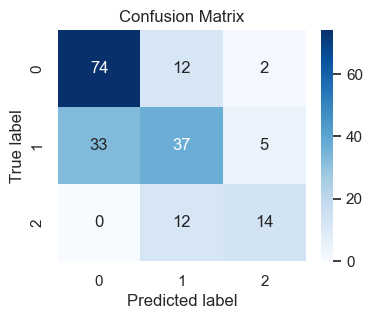

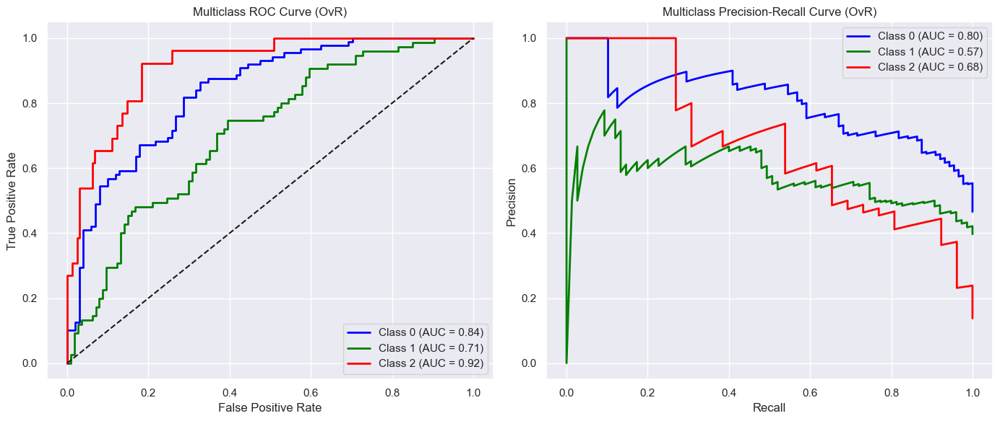


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.93      0.87      0.90       163
           1       0.41      0.58      0.48        26

    accuracy                           0.83       189
   macro avg       0.67      0.72      0.69       189
weighted avg       0.86      0.83      0.84       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8765927324209533
PR AUC: 0.6120497626761229


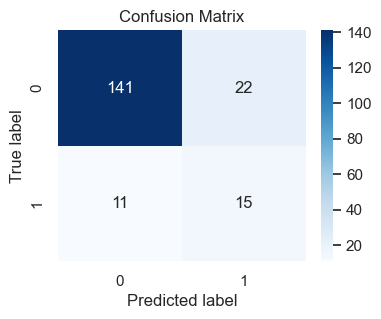

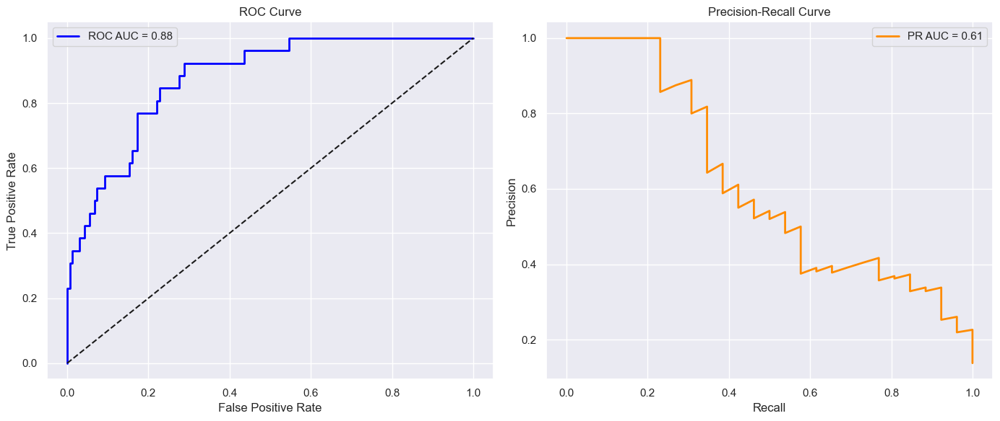


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.77      0.64      0.70       114
           1       0.56      0.71      0.63        75

    accuracy                           0.67       189
   macro avg       0.67      0.67      0.66       189
weighted avg       0.69      0.67      0.67       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7596491228070176
PR AUC: 0.6348825911220812


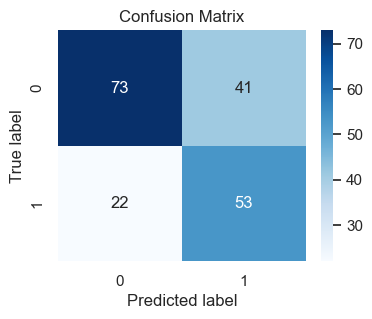

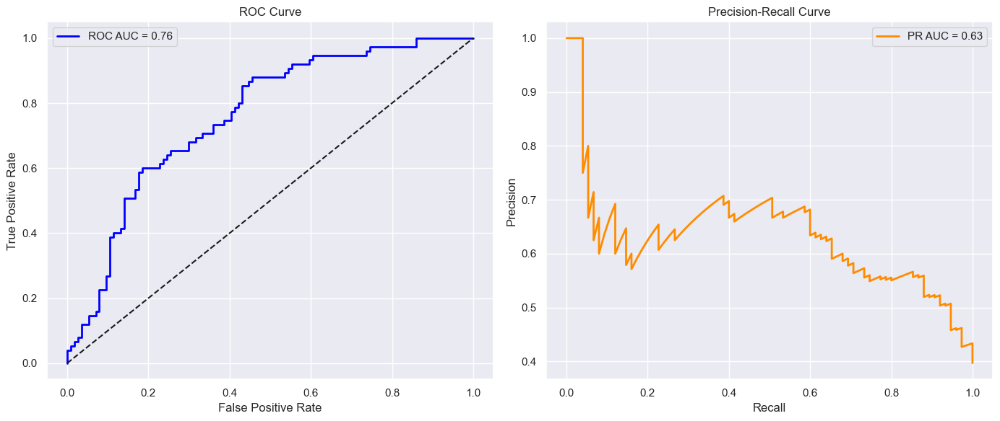


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.80      0.71      0.75       101
           1       0.71      0.80      0.75        88

    accuracy                           0.75       189
   macro avg       0.75      0.75      0.75       189
weighted avg       0.76      0.75      0.75       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8265076507650765
PR AUC: 0.78214456528274


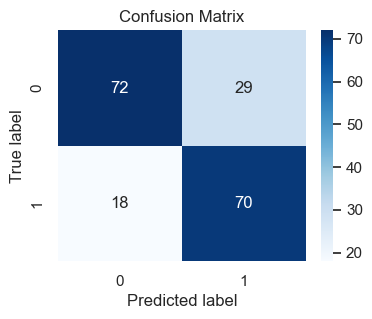

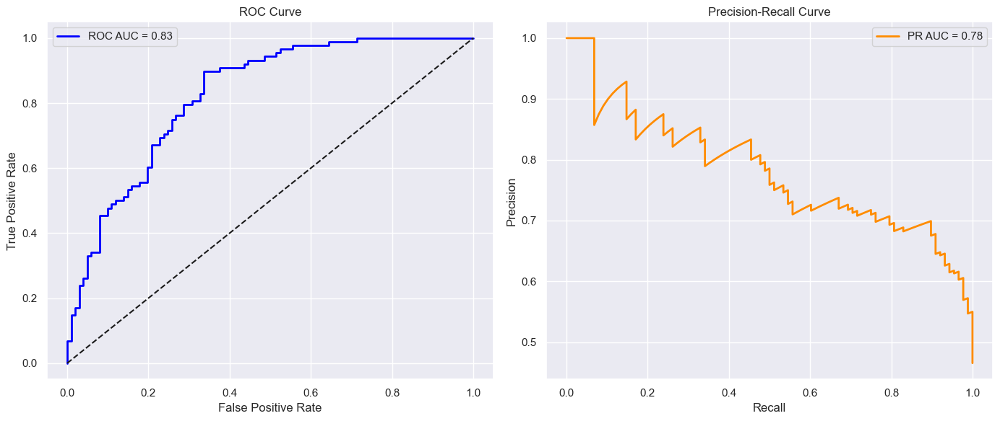

In [32]:
xgb = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',
    use_label_encoder=False,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=500,
    subsample=0.9
)
weights = compute_sample_weight(class_weight='balanced', y=y_train)

xgb.fit(X_train, y_train, sample_weight=weights)

y_pred = xgb.predict(X_test)
y_pred_proba = xgb.predict_proba(X_test)

calculate_evaluation_metrics(xgb, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_3_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    xgb_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        use_label_encoder=False,
        learning_rate=0.01,
        max_depth=3,
        n_estimators=500,
        subsample=0.9
    )
    weights = compute_sample_weight(class_weight='balanced', y=y_train_bin)

    xgb_bin.fit(X_train_bin, y_train_bin, sample_weight=weights)

    y_pred_bin = xgb_bin.predict(X_test_bin)
    y_pred_proba_bin = xgb_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

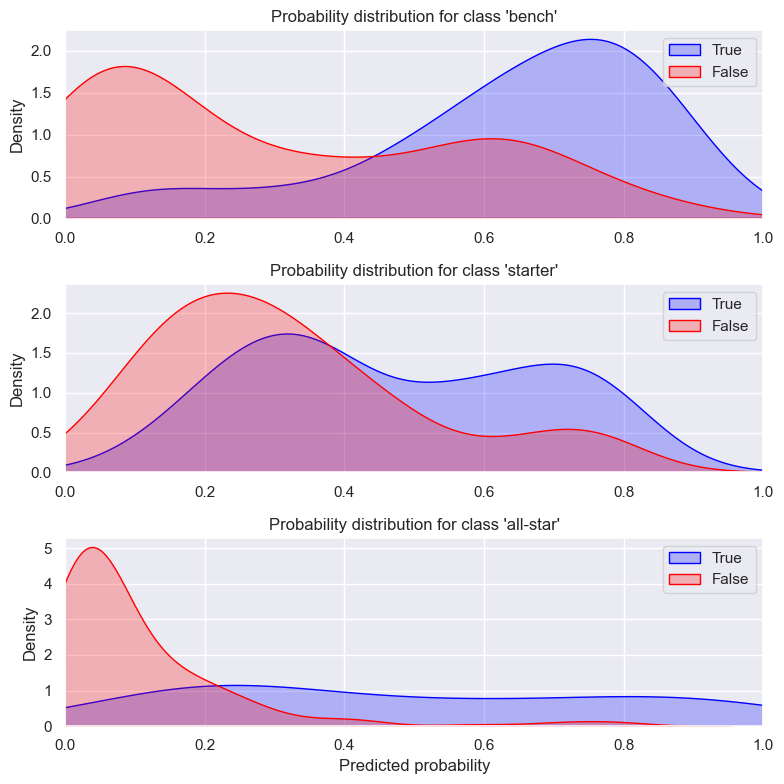

PermutationExplainer explainer: 190it [01:14,  2.47it/s]                         


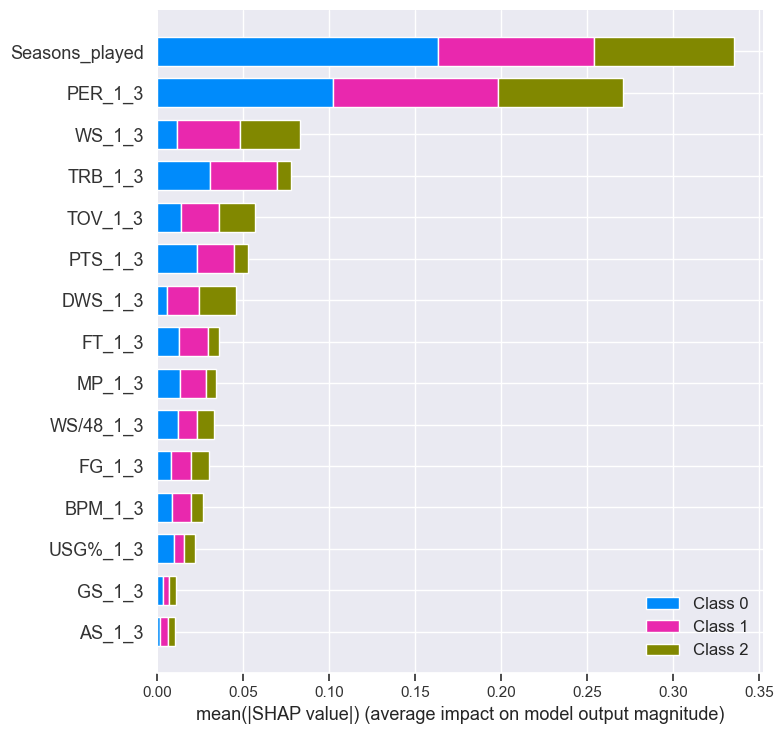

In [33]:
plot_class_probability_distributions(y_test, y_pred_proba)
display_shap_plot(xgb, X_train, X_test)

In [34]:
display_lime_plot(xgb, X_train, X_test, 0)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.75      0.72      0.73        88
           1       0.61      0.64      0.62        75
           2       0.62      0.62      0.62        26

    accuracy                           0.67       189
   macro avg       0.66      0.66      0.66       189
weighted avg       0.67      0.67      0.67       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8222187170034655
PR AUC: 0.6851256311776548


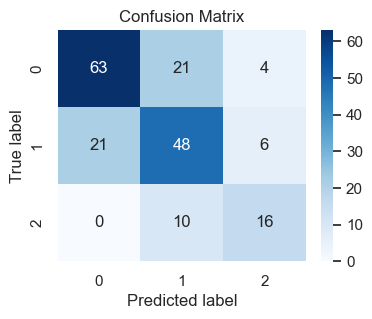

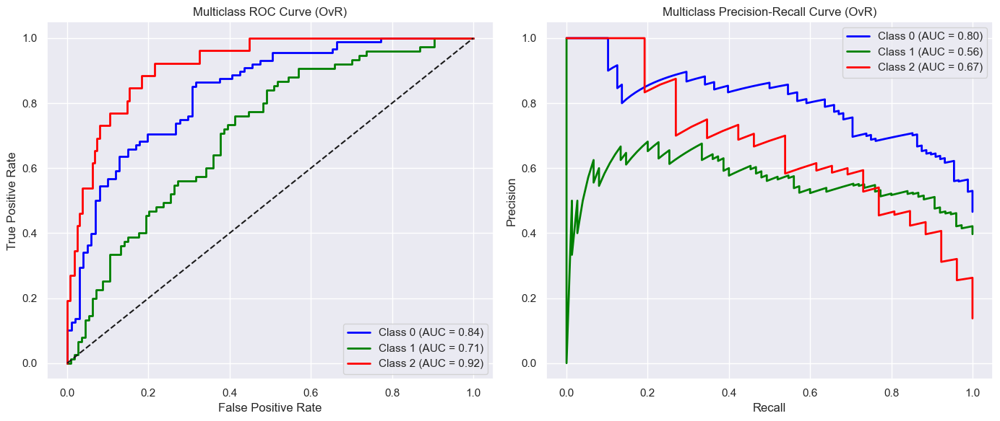


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.93      0.88      0.90       163
           1       0.43      0.58      0.49        26

    accuracy                           0.84       189
   macro avg       0.68      0.73      0.70       189
weighted avg       0.86      0.84      0.85       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8857951864086834
PR AUC: 0.6115196131369651


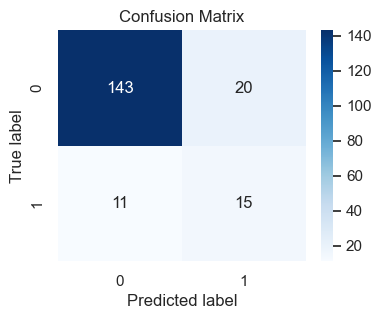

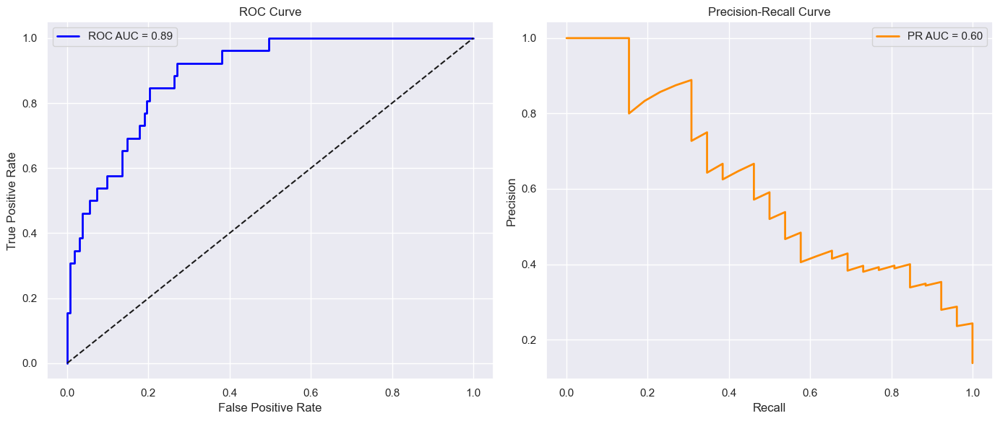


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.91      0.36      0.52       114
           1       0.49      0.95      0.65        75

    accuracy                           0.59       189
   macro avg       0.70      0.65      0.58       189
weighted avg       0.75      0.59      0.57       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7623391812865498
PR AUC: 0.6511643288502371


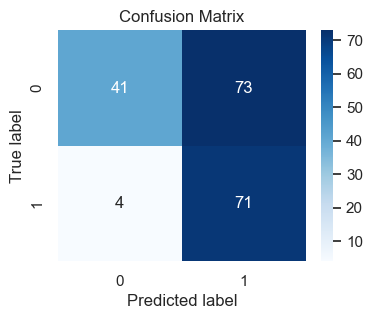

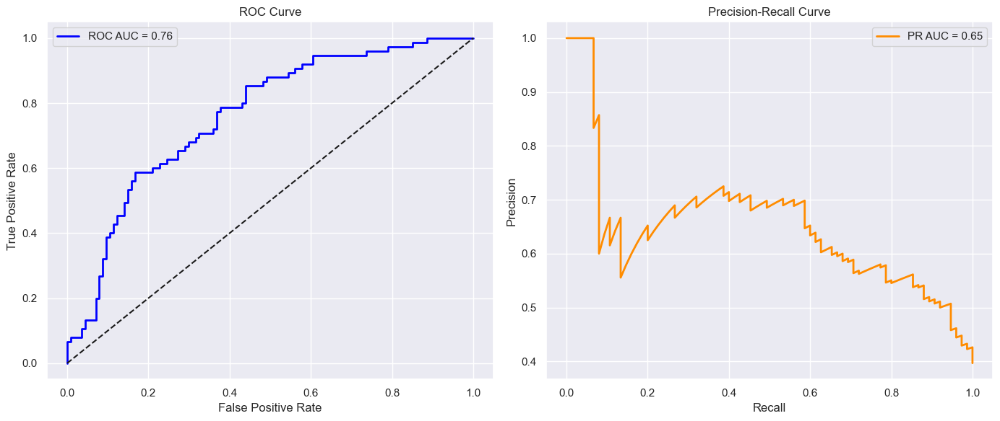


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.92      0.49      0.64       101
           1       0.62      0.95      0.75        88

    accuracy                           0.70       189
   macro avg       0.77      0.72      0.69       189
weighted avg       0.78      0.70      0.69       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8287578757875789
PR AUC: 0.7881852547836006


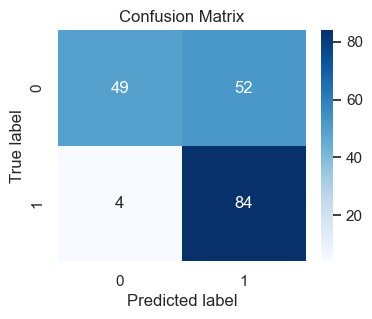

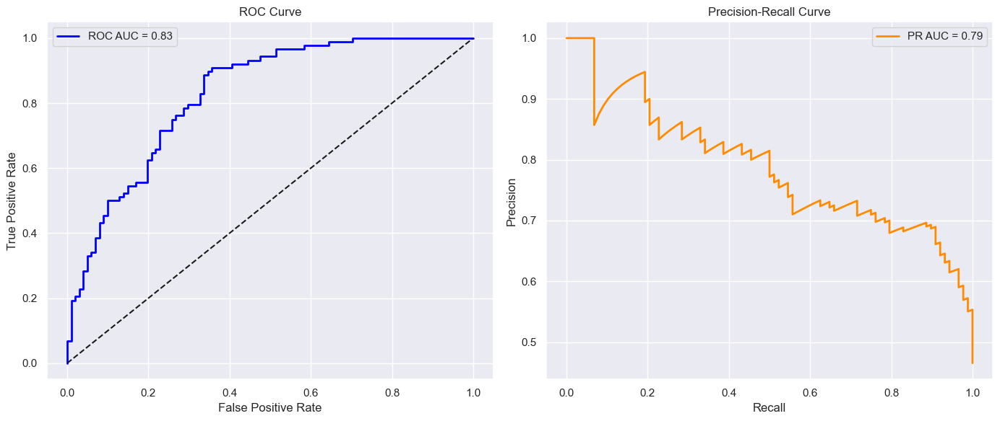

In [36]:
xgb = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',
    use_label_encoder=False,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=400,
    subsample=0.9
)
ovr = OneVsRestClassifier(xgb)
ovr.fit(X_train, y_train)

y_pred_proba = ovr.predict_proba(X_test)

custom_preds = []
for probs in y_pred_proba:
    if probs[2] >= 0.15:        
        custom_preds.append(2)
    elif probs[1] >= 0.35:      
        custom_preds.append(1)
    else:
        custom_preds.append(0) 
        
y_pred_proba = y_pred_proba / y_pred_proba.sum(axis=1, keepdims=True)

calculate_evaluation_metrics(ovr, y_test, custom_preds, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_3_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    xgb_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        use_label_encoder=False,
        learning_rate=0.01,
        max_depth=3,
        n_estimators=400,
        subsample=0.9
    )

    xgb_bin.fit(X_train_bin, y_train_bin)

    y_pred_proba_bin = xgb_bin.predict_proba(X_test_bin)
    y_pred_bin = (y_pred_proba_bin[:,1] >= 0.2).astype(int)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

Number of elements in each class:
Player_class_num
0    351
1    300
2    102
Name: count, dtype: int64

Number of elements in each class after sampling:
Player_class_num
1    351
0    351
2    351
Name: count, dtype: int64

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.69      0.82      0.75        88
           1       0.62      0.51      0.56        75
           2       0.62      0.58      0.60        26

    accuracy                           0.66       189
   macro avg       0.65      0.63      0.64       189
weighted avg       0.66      0.66      0.65       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8245867026863968
PR AUC: 0.6897480518610921


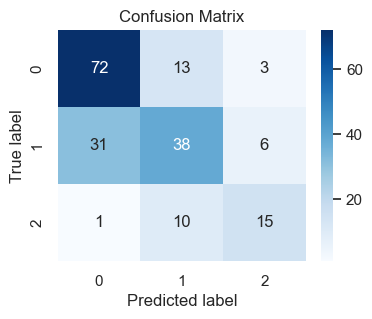

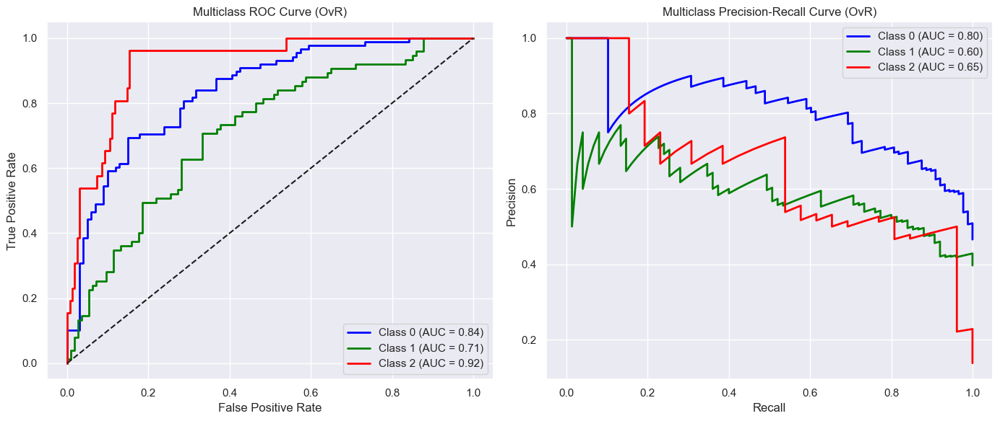

Number of elements in each class:
all-star_class
0    651
1    102
Name: count, dtype: int64

Number of elements in each class after sampling:
all-star_class
0    651
1    651
Name: count, dtype: int64

Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.96      0.82      0.88       163
           1       0.41      0.77      0.53        26

    accuracy                           0.81       189
   macro avg       0.68      0.80      0.71       189
weighted avg       0.88      0.81      0.84       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8848513449740444
PR AUC: 0.5403848228188103


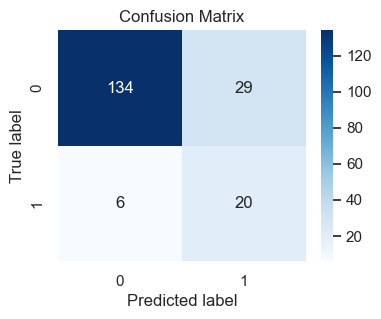

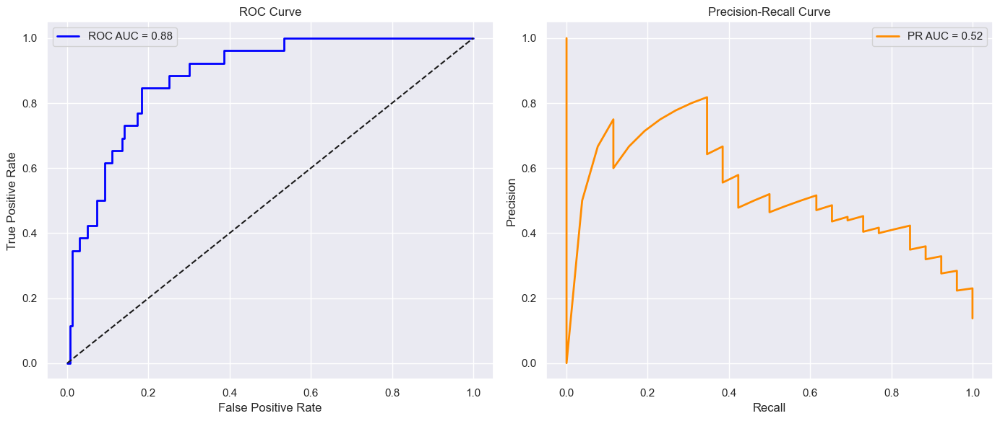

Number of elements in each class:
starter_class
0    453
1    300
Name: count, dtype: int64

Number of elements in each class after sampling:
starter_class
1    453
0    453
Name: count, dtype: int64

Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.80      0.65      0.71       114
           1       0.58      0.75      0.65        75

    accuracy                           0.69       189
   macro avg       0.69      0.70      0.68       189
weighted avg       0.71      0.69      0.69       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7666666666666667
PR AUC: 0.6383091189831362


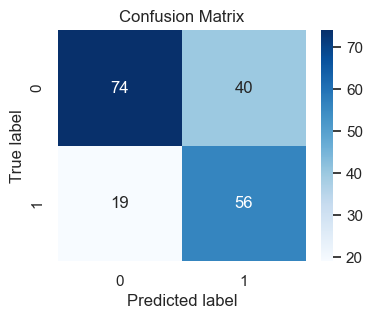

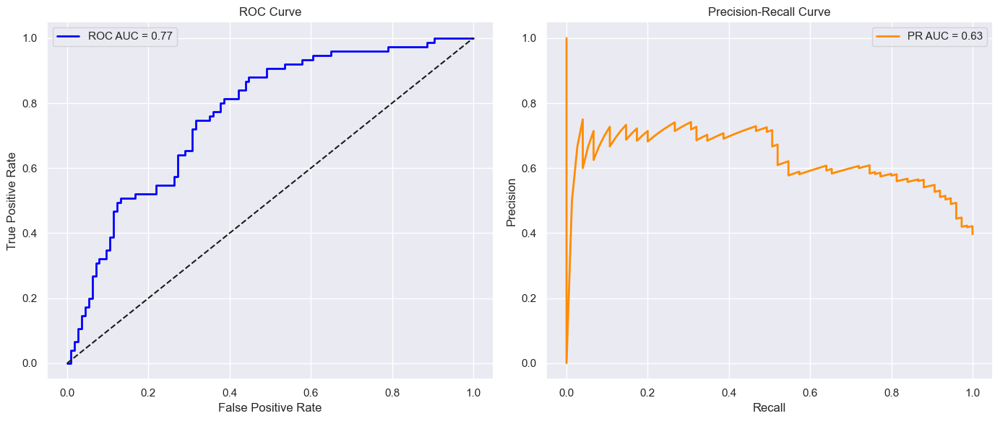

Number of elements in each class:
bench_class
0    402
1    351
Name: count, dtype: int64

Number of elements in each class after sampling:
bench_class
1    402
0    402
Name: count, dtype: int64

Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.78      0.71      0.75       101
           1       0.70      0.77      0.74        88

    accuracy                           0.74       189
   macro avg       0.74      0.74      0.74       189
weighted avg       0.74      0.74      0.74       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8267326732673268
PR AUC: 0.7801700835140952


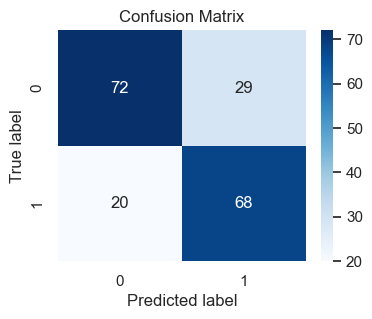

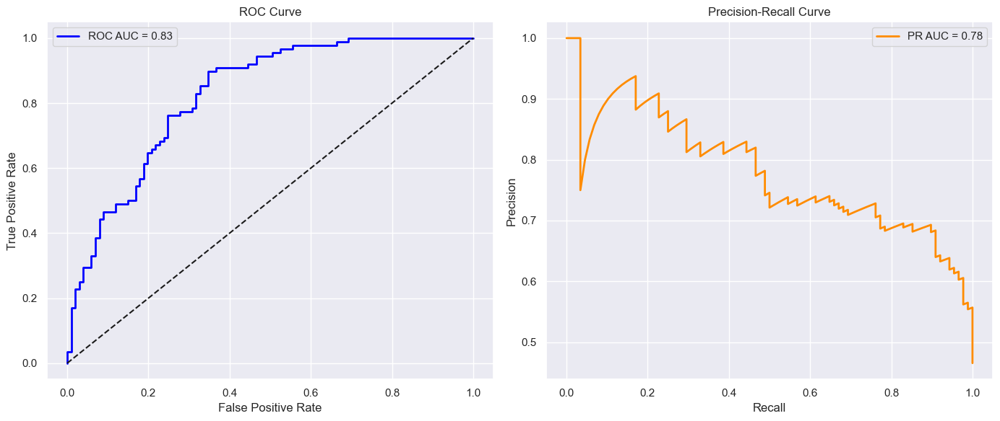

In [33]:
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

print('Number of elements in each class:')
print(y_train.value_counts())
print('\nNumber of elements in each class after sampling:')
print(pd.Series(y_res).value_counts())

xgb_smote = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',     
    max_depth=3,          
    learning_rate=0.01,  
    n_estimators=500,  
    subsample=0.9)

xgb_smote.fit(X_res, y_res)

y_pred = xgb_smote.predict(X_test)
y_pred_proba = xgb_smote.predict_proba(X_test)

calculate_evaluation_metrics(xgb_smote, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_3_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    smote = SMOTE(random_state=42)
    X_res_bin, y_res_bin = smote.fit_resample(X_train_bin, y_train_bin)

    print('Number of elements in each class:')
    print(y_train_bin.value_counts())
    print('\nNumber of elements in each class after sampling:')
    print(pd.Series(y_res_bin).value_counts())
    
    xgb_smote_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',     
        max_depth=3,          
        learning_rate=0.01,  
        n_estimators=500,  
        subsample=0.9)

    xgb_smote_bin.fit(X_res_bin, y_res_bin)

    y_pred_bin = xgb_smote_bin.predict(X_test_bin)
    y_pred_proba_bin = xgb_smote_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_smote_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

<h3>Classification results, input: statistics from the <b>rookie</b> season</h3>

In [40]:
df_1 = pd.read_csv('data/final_dataset_1_seasons.csv', low_memory=False)

class_mapping = {'bench': 0, 'starter': 1, 'all-star': 2}
df_1['Player_class_num'] = df_1['Player_class'].map(class_mapping)

final_dataset_1_seasons = df_1[get_selected_features(1)]

X = final_dataset_1_seasons.drop(columns=['Player_class_num'])
y = final_dataset_1_seasons['Player_class_num']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.68      0.76      0.72        88
           1       0.56      0.47      0.51        75
           2       0.52      0.54      0.53        26

    accuracy                           0.61       189
   macro avg       0.58      0.59      0.58       189
weighted avg       0.61      0.61      0.61       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7717538005632361
PR AUC: 0.6219126720723476


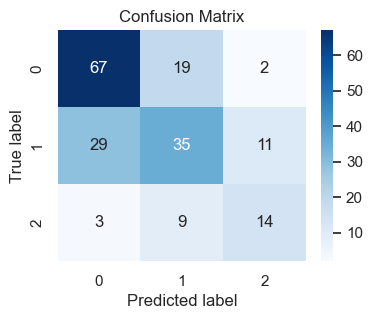

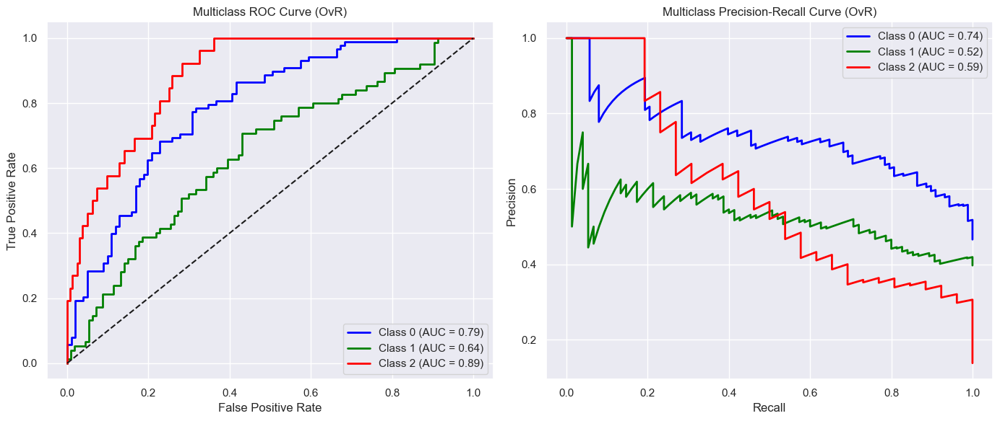


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.94      0.85      0.89       163
           1       0.40      0.65      0.50        26

    accuracy                           0.82       189
   macro avg       0.67      0.75      0.70       189
weighted avg       0.87      0.82      0.84       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8364794714487966
PR AUC: 0.5410661694890093


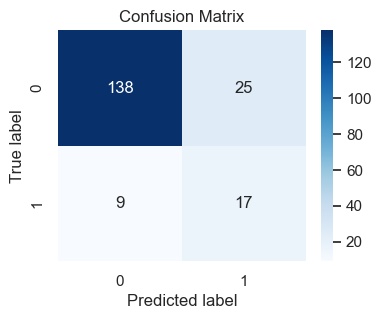

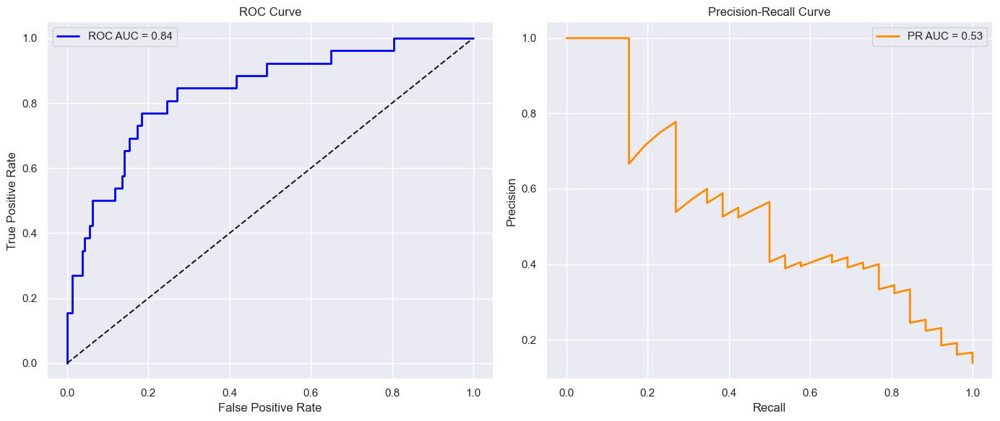


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.72      0.65      0.68       114
           1       0.53      0.61      0.57        75

    accuracy                           0.63       189
   macro avg       0.63      0.63      0.63       189
weighted avg       0.65      0.63      0.64       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.6777777777777778
PR AUC: 0.5295651824734198


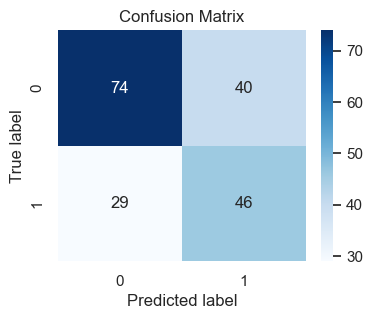

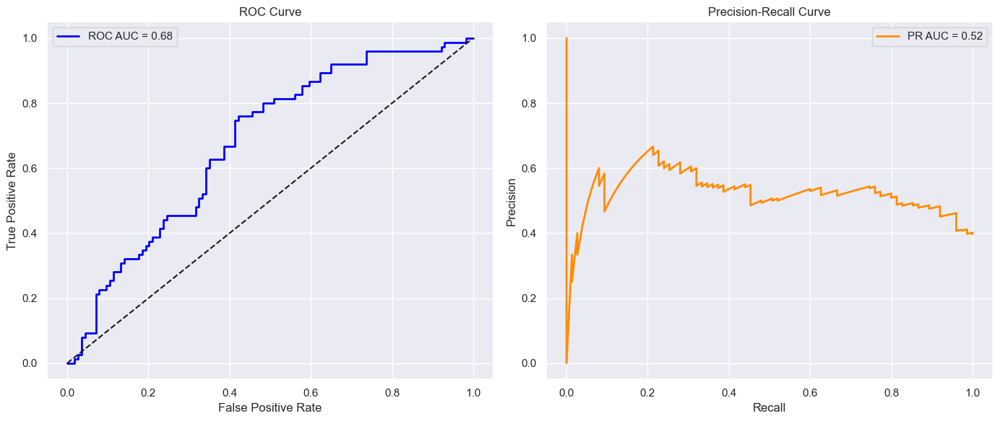


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.82      0.64      0.72       101
           1       0.67      0.84      0.75        88

    accuracy                           0.74       189
   macro avg       0.75      0.74      0.73       189
weighted avg       0.75      0.74      0.73       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8036678667866787
PR AUC: 0.7331980452424218


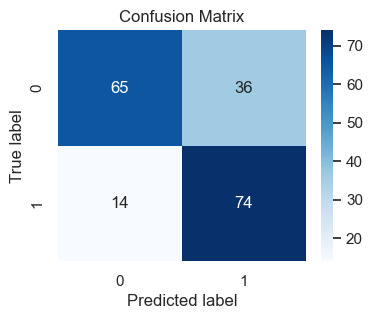

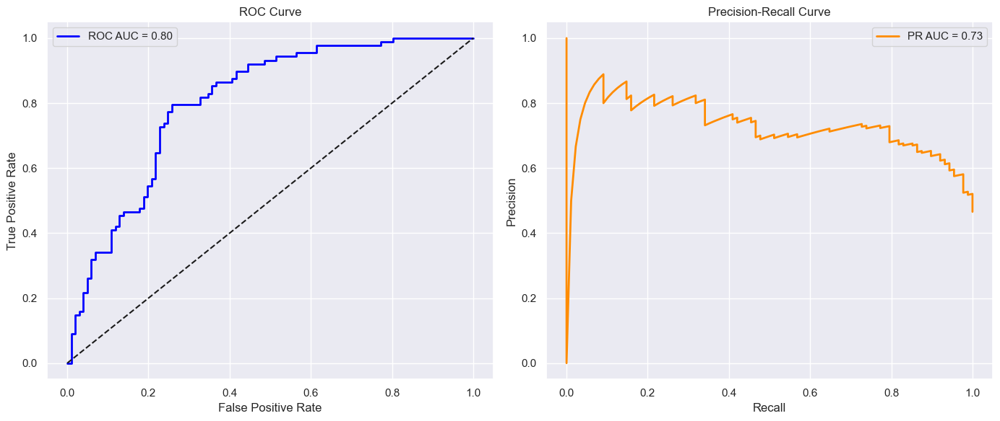

In [47]:
xgb = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',
    use_label_encoder=False,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=500,
    subsample=0.9
)
weights = compute_sample_weight(class_weight='balanced', y=y_train)

xgb.fit(X_train, y_train, sample_weight=weights)

y_pred = xgb.predict(X_test)
y_pred_proba = xgb.predict_proba(X_test)

calculate_evaluation_metrics(xgb, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_1_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    xgb_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        use_label_encoder=False,
        learning_rate=0.01,
        max_depth=3,
        n_estimators=500,
        subsample=0.9
    )
    weights = compute_sample_weight(class_weight='balanced', y=y_train_bin)

    xgb_bin.fit(X_train_bin, y_train_bin, sample_weight=weights)

    y_pred_bin = xgb_bin.predict(X_test_bin)
    y_pred_proba_bin = xgb_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

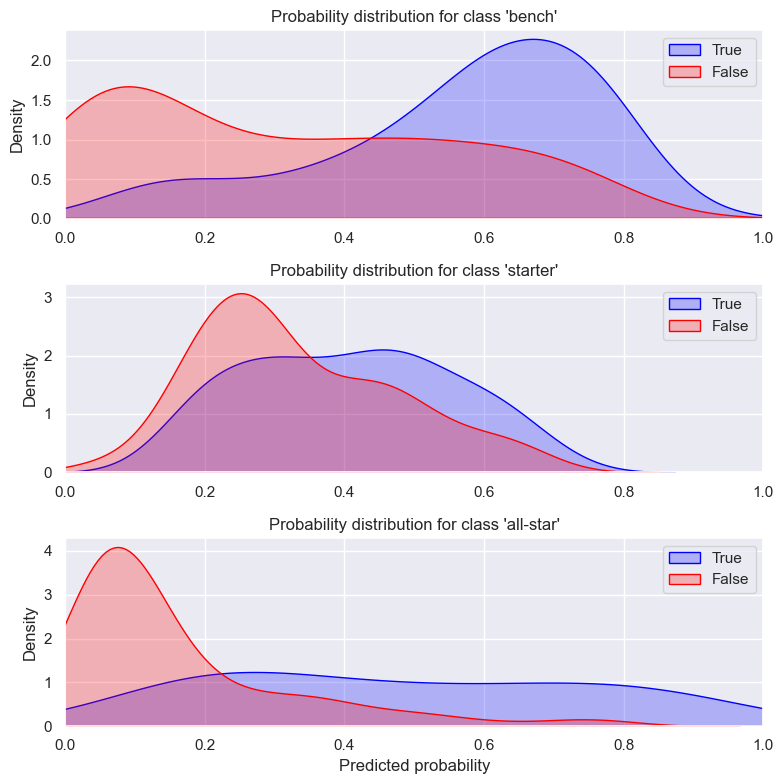

PermutationExplainer explainer: 190it [01:18,  2.36it/s]                         


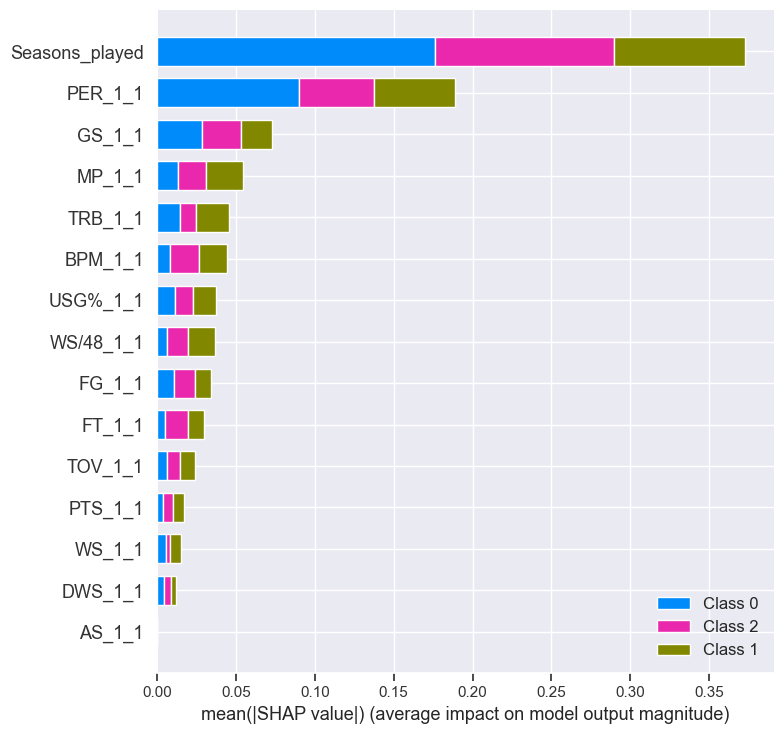

In [48]:
plot_class_probability_distributions(y_test, y_pred_proba)
display_shap_plot(xgb, X_train, X_test)

In [39]:
display_lime_plot(xgb, X_train, X_test, 0)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.69      0.60      0.64        88
           1       0.50      0.45      0.48        75
           2       0.41      0.69      0.51        26

    accuracy                           0.56       189
   macro avg       0.53      0.58      0.54       189
weighted avg       0.58      0.56      0.56       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7624978048089203
PR AUC: 0.6126050023410674


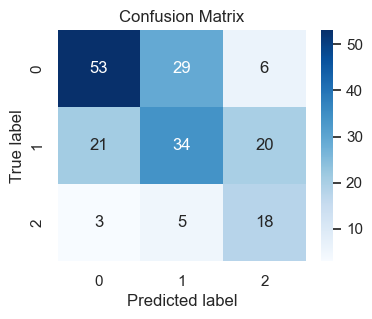

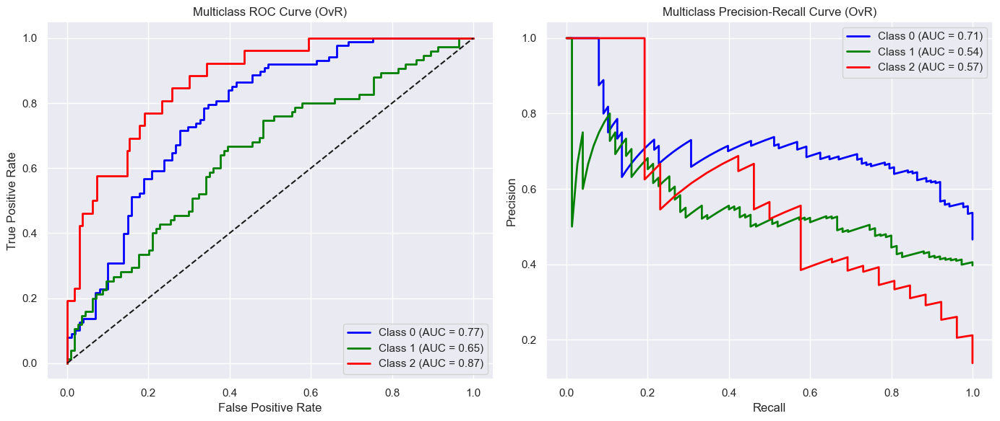


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.92      0.86      0.89       163
           1       0.38      0.54      0.44        26

    accuracy                           0.81       189
   macro avg       0.65      0.70      0.67       189
weighted avg       0.85      0.81      0.83       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8312883435582822
PR AUC: 0.5068725377751767


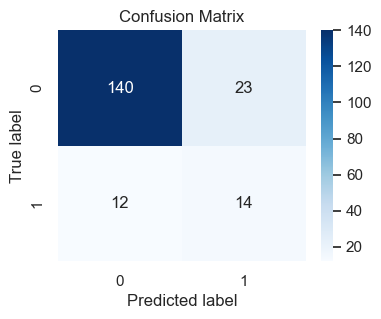

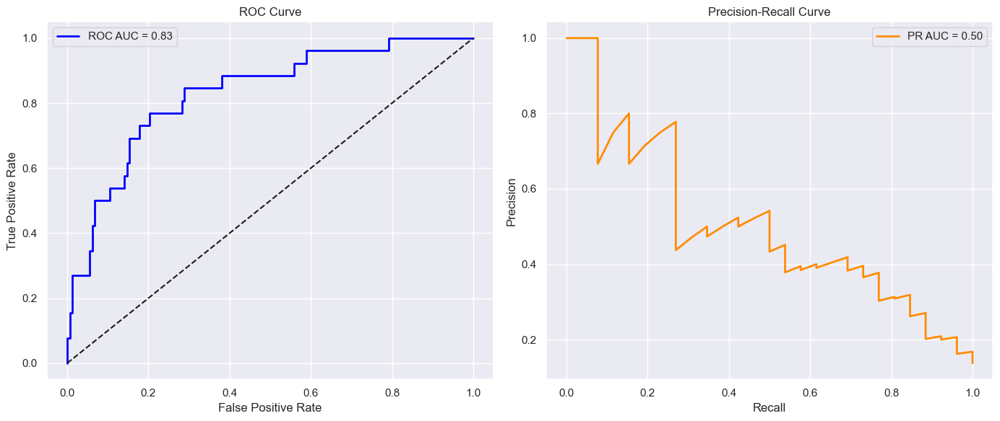


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.87      0.18      0.29       114
           1       0.43      0.96      0.60        75

    accuracy                           0.49       189
   macro avg       0.65      0.57      0.44       189
weighted avg       0.70      0.49      0.41       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.6824561403508772
PR AUC: 0.5335485639324082


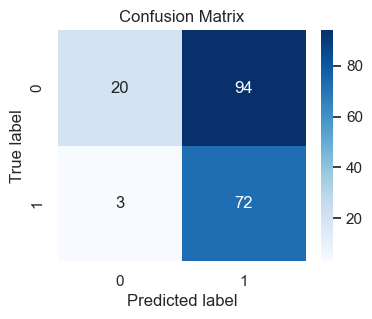

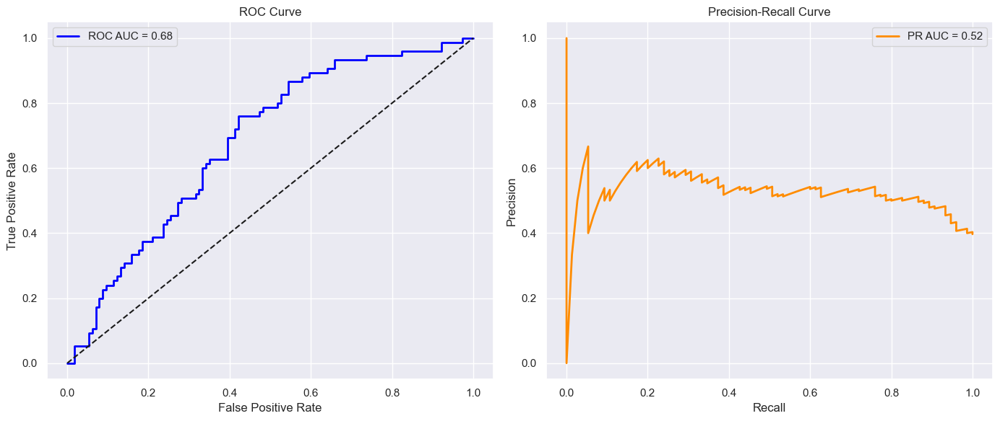


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.93      0.40      0.56       101
           1       0.58      0.97      0.73        88

    accuracy                           0.66       189
   macro avg       0.76      0.68      0.64       189
weighted avg       0.77      0.66      0.64       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8081683168316832
PR AUC: 0.739655612840521


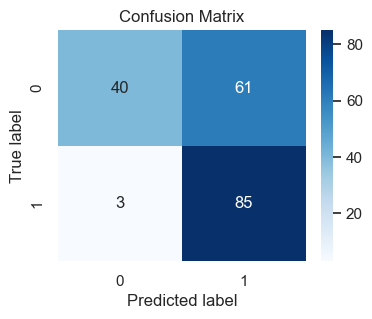

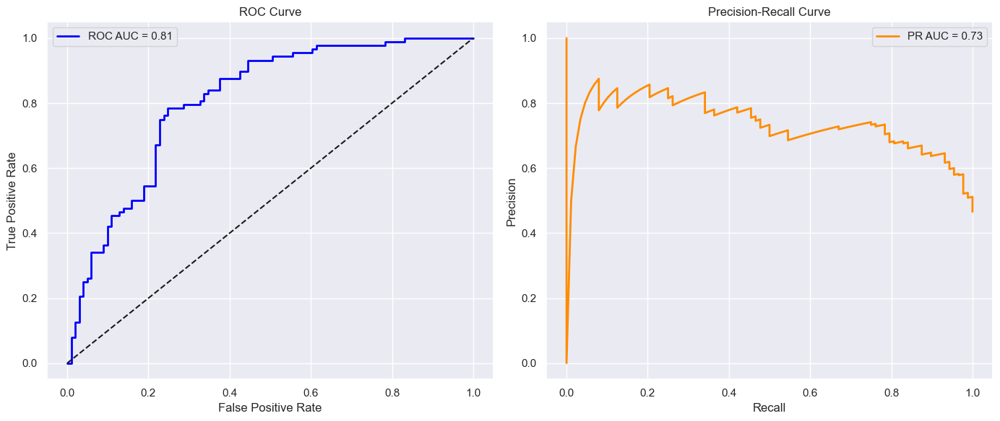

In [46]:
xgb = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',
    use_label_encoder=False,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=400,
    subsample=0.9
)
ovr = OneVsRestClassifier(xgb)
ovr.fit(X_train, y_train)

y_pred_proba = ovr.predict_proba(X_test)

custom_preds = []
for probs in y_pred_proba:
    if probs[2] >= 0.15:        
        custom_preds.append(2)
    elif probs[1] >= 0.35:      
        custom_preds.append(1)
    else:
        custom_preds.append(0) 
        
y_pred_proba = y_pred_proba / y_pred_proba.sum(axis=1, keepdims=True)

calculate_evaluation_metrics(ovr, y_test, custom_preds, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_1_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    xgb_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        use_label_encoder=False,
        learning_rate=0.01,
        max_depth=3,
        n_estimators=400,
        subsample=0.9
    )

    xgb_bin.fit(X_train_bin, y_train_bin)

    y_pred_proba_bin = xgb_bin.predict_proba(X_test_bin)
    y_pred_bin = (y_pred_proba_bin[:,1] >= 0.2).astype(int)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

Number of elements in each class:
Player_class_num
0    351
1    300
2    102
Name: count, dtype: int64

Number of elements in each class after sampling:
Player_class_num
1    351
0    351
2    351
Name: count, dtype: int64

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.69      0.75      0.72        88
           1       0.55      0.48      0.51        75
           2       0.48      0.50      0.49        26

    accuracy                           0.61       189
   macro avg       0.57      0.58      0.57       189
weighted avg       0.60      0.61      0.60       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7566300935293765
PR AUC: 0.5897219198040067


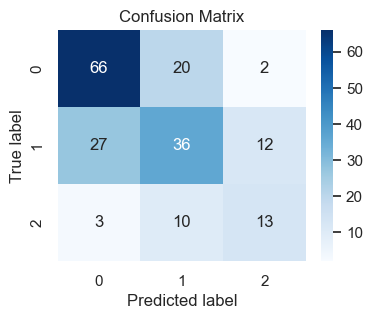

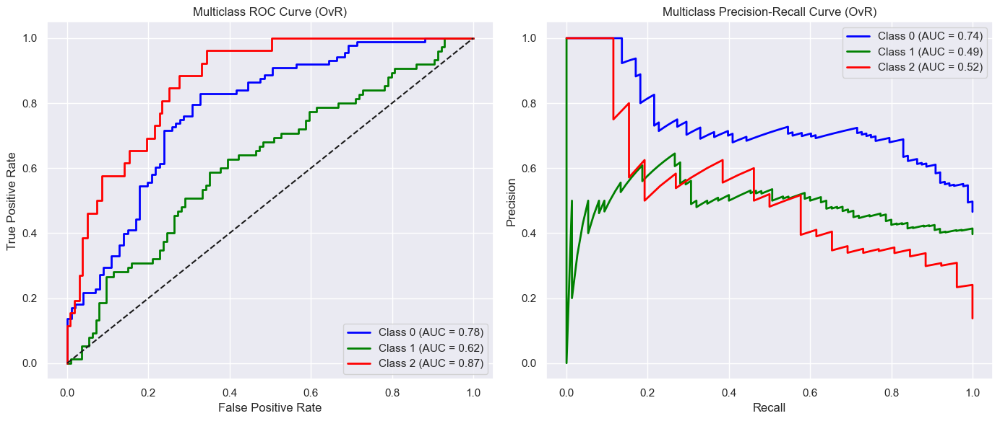

Number of elements in each class:
all-star_class
0    651
1    102
Name: count, dtype: int64

Number of elements in each class after sampling:
all-star_class
0    651
1    651
Name: count, dtype: int64

Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.94      0.83      0.88       163
           1       0.39      0.69      0.50        26

    accuracy                           0.81       189
   macro avg       0.67      0.76      0.69       189
weighted avg       0.87      0.81      0.83       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8275129778197263
PR AUC: 0.4901180225194054


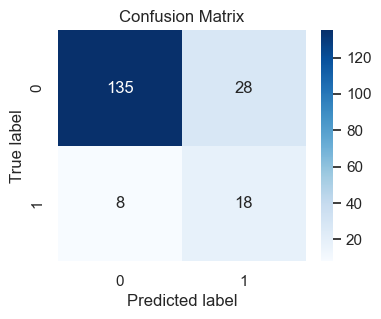

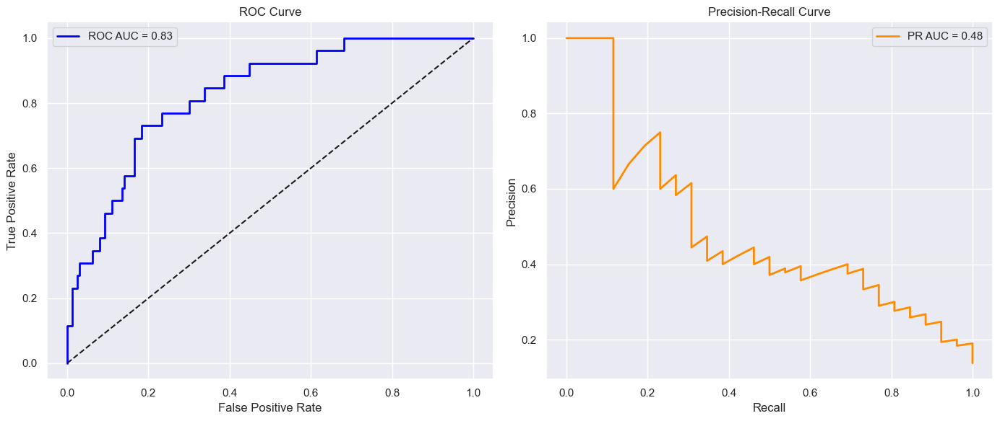

Number of elements in each class:
starter_class
0    453
1    300
Name: count, dtype: int64

Number of elements in each class after sampling:
starter_class
1    453
0    453
Name: count, dtype: int64

Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.68      0.66      0.67       114
           1       0.50      0.52      0.51        75

    accuracy                           0.60       189
   macro avg       0.59      0.59      0.59       189
weighted avg       0.61      0.60      0.60       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.6715789473684209
PR AUC: 0.5260860970960328


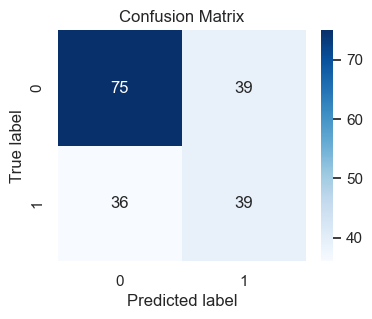

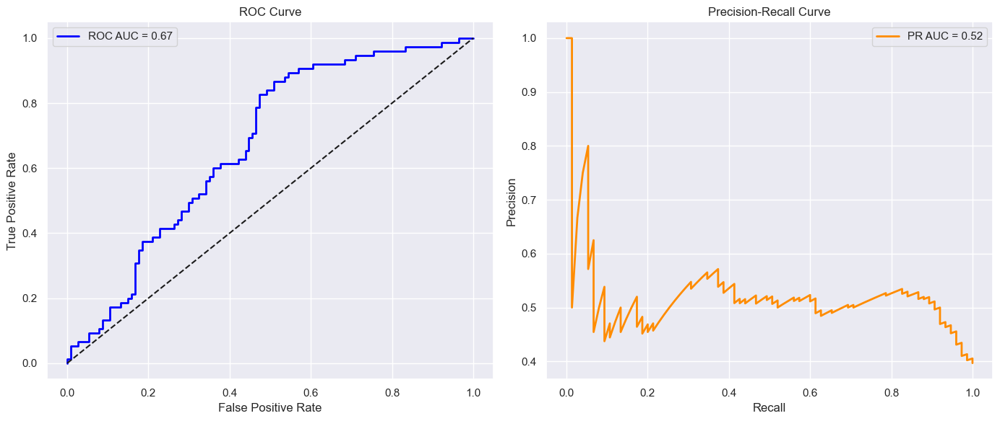

Number of elements in each class:
bench_class
0    402
1    351
Name: count, dtype: int64

Number of elements in each class after sampling:
bench_class
1    402
0    402
Name: count, dtype: int64

Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.81      0.63      0.71       101
           1       0.66      0.83      0.74        88

    accuracy                           0.72       189
   macro avg       0.74      0.73      0.72       189
weighted avg       0.74      0.72      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8011926192619262
PR AUC: 0.7324545968443268


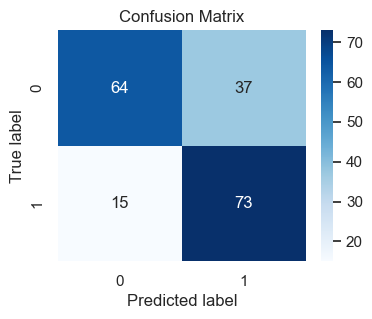

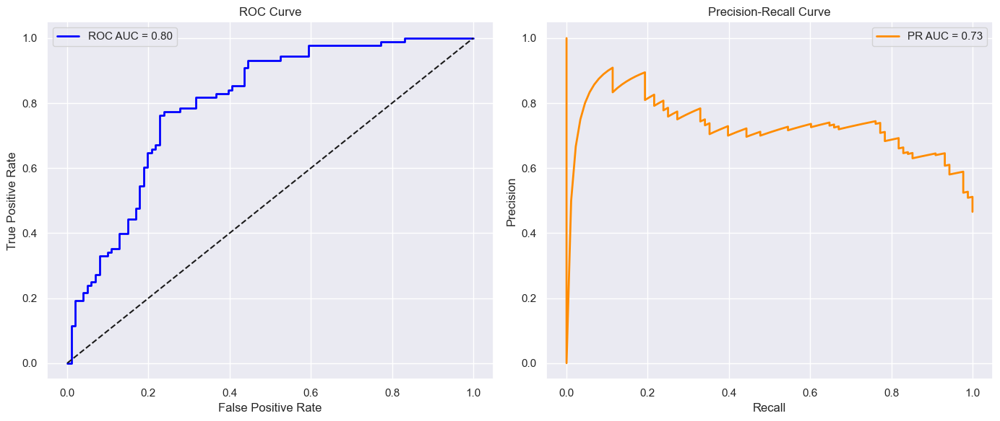

In [45]:
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

print('Number of elements in each class:')
print(y_train.value_counts())
print('\nNumber of elements in each class after sampling:')
print(pd.Series(y_res).value_counts())

xgb_smote = XGBClassifier(
    random_state=42,
    eval_metric='mlogloss',     
    max_depth=3,          
    learning_rate=0.01,  
    n_estimators=500,  
    subsample=0.9
)

xgb_smote.fit(X_res, y_res)

y_pred = xgb_smote.predict(X_test)
y_pred_proba = xgb_smote.predict_proba(X_test)

calculate_evaluation_metrics(xgb_smote, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_1_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    smote = SMOTE(random_state=42)
    X_res_bin, y_res_bin = smote.fit_resample(X_train_bin, y_train_bin)

    print('Number of elements in each class:')
    print(y_train_bin.value_counts())
    print('\nNumber of elements in each class after sampling:')
    print(pd.Series(y_res_bin).value_counts())
    
    xgb_smote_bin = XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',     
        max_depth=3,          
        learning_rate=0.01,  
        n_estimators=500,  
        subsample=0.9
    )

    xgb_smote_bin.fit(X_res_bin, y_res_bin)

    y_pred_bin = xgb_smote_bin.predict(X_test_bin)
    y_pred_proba_bin = xgb_smote_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(xgb_smote_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)